# <strong> I - Importation de modules

In [1]:
########################################################################################
###############          Gestion de warning  backend et divers       ###################
%pylab inline
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

########################################################################################
########################################################################################
import numpy as np
import pandas as pd
from tqdm import tqdm
import PIL
import matplotlib.pyplot as plt
from matplotlib import colors
import seaborn as sns

########################################################################################
#########################       Gestionnaire fichiers       ############################
import json
import shutil
from glob import glob
import cv2
import os

########################################################################################
##########################       Augmentation d'image       ############################
try :
    import imgaug    #  import imaug as ia
    import imgaug as ia
except :
    !pip install imgaug
    import imgaug     #  import imaug as ia
    import imgaug as ia
import imgaug.augmenters as iaa
from imgaug.augmentables.segmaps import SegmentationMapsOnImage
from imgaug.augmentables.batches import UnnormalizedBatch

########################################################################################
########################################################################################
from sklearn.base import BaseEstimator,TransformerMixin

########################################################################################
########################################################################################
try :
    from tensorflow.keras.preprocessing.image import image_utils
except :
    from tensorflow.keras.preprocessing import image as image_utils

########################################################################################
################          Importation de modules personnels         ####################
try :
    import import_ipynb
except :
    !pip install import-ipynb
    import import_ipynb
from Brice_KENGNI_ZANGUIM_2_1_script_functions_25_10_2022 import *

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib
importing Jupyter notebook from Brice_KENGNI_ZANGUIM_2_1_script_functions_25_10_2022.ipynb


# <strong> I - Typologie des données à disposition

## Les données à disposition sont séparé en deux famille :

####  <strong>   - Les images brutes : 
     
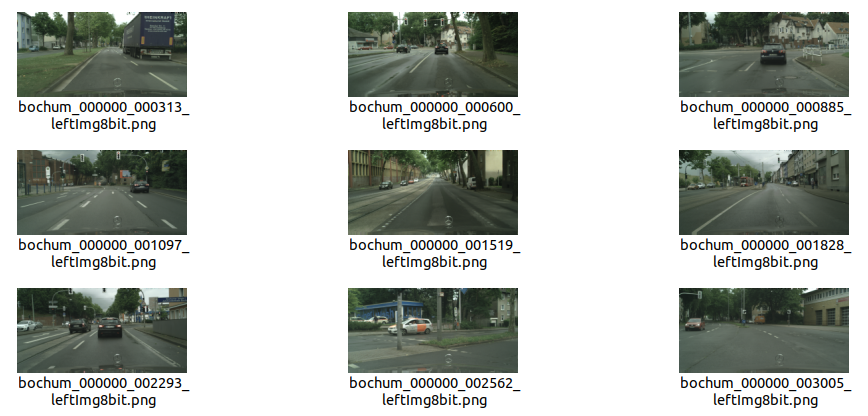
     
####  <strong>   - Les masques et fichiers .json associés à chacune des images : 
    
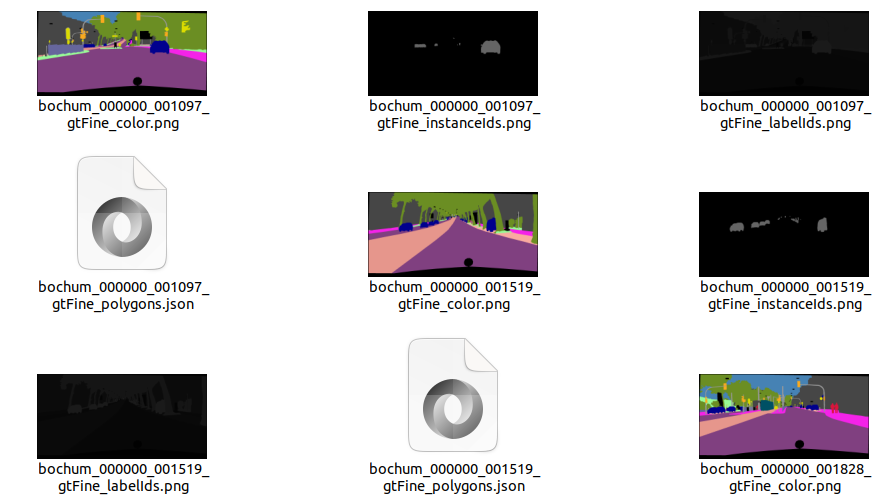



# <strong> II - Exploration des données

- ###   <strong>   Chemin vers les images

In [2]:
chemin_image = os.getcwd()+"/datas/images/" 
chemin_masque_color = os.getcwd()+"/datas/masque_color/" 
chemin_masque_labelIds = os.getcwd()+"/datas/masque_labelIds/" 
chemin_masque_instanceIds = os.getcwd()+"/datas/masque_instanceIds/" 

In [3]:
######################## liste de noms des images    ######################## 
nom_images = sorted( os.listdir( chemin_image ) )

########################  liste des masques  couleurs   ########################
nom_color_maque = [ i for i in os.listdir( chemin_masque_color ) ]

########################  liste des masques instanceid   ########################
nom_color_maque = [ i for i in os.listdir( chemin_masque_instanceIds ) ]

########################   liste des masques labeld  ########################
nom_color_maque = [ i for i in os.listdir( chemin_masque_labelIds ) ]


- ###  <strong>   On devrait avoir autant d'images que de masque de chaque catégories

In [4]:
len( nom_images )  ==  len( nom_color_maque )  ==   len(nom_color_maque)  ==  len( nom_color_maque )

True

-  ###  <strong>   Les fichiers apariés à la même image doivent avoir le même nom dans chaque repertoire

In [5]:
rename = True

if rename :
    for chemin in [ chemin_image, chemin_masque_color, chemin_masque_instanceIds, chemin_masque_labelIds ] :
        for name in os.listdir( chemin ) :
            if ".png.png" in name :
                now = ".".join( name.split(".")[:-1] )
            else :
                now = "_".join(name.split("_")[:3] ) + ".png"
                if ".png.png" in now :
                    break
            shutil.move( chemin+name , chemin+now)

-  ###  <strong>   Je recupère la liste des noms de fichiers

In [6]:
files_name = sorted( os.listdir(chemin_image) )
print( files_name[:4] )

['aachen_000000_000019.png', 'aachen_000001_000019.png', 'aachen_000002_000019.png', 'aachen_000003_000019.png']


# <strong> III - Visualisation des données

# <strong> III.1 - Images brutes

- ###  <strong>   Visualisation

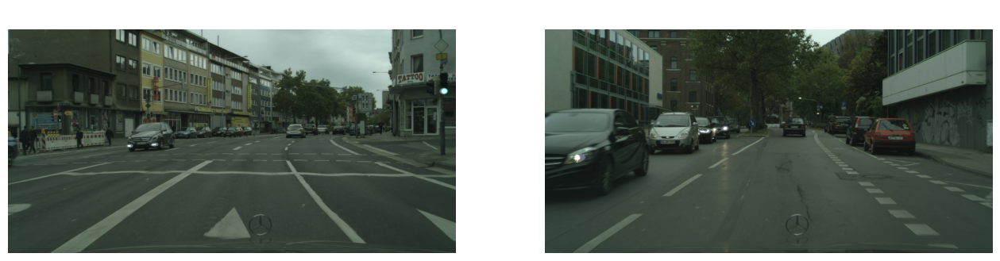

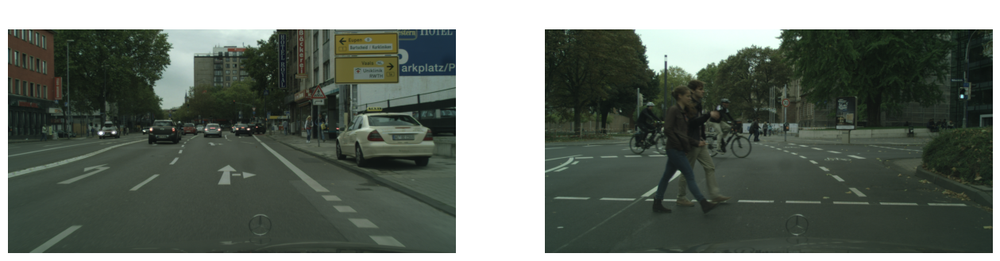

In [9]:
afficher_une_serie_d_images(
                            [ chemin_image+files_name[i] for i in range(7) ],
                            [ chemin_image+files_name[i+26] for i in range(7) ],
                            n = 2,
                            figsize = (16,8),
                            gray=False
                            )

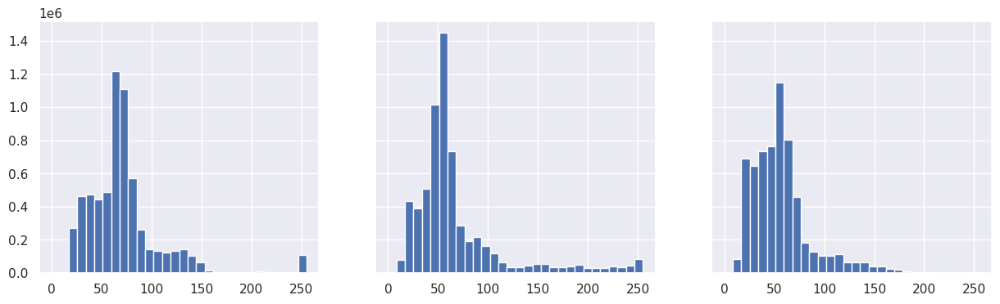

In [10]:
fig, ax = plt.subplots(1,3, figsize = (15,4), sharey=True)
for i in range(3) :
    ax[i].hist(np.array( image_utils.load_img(chemin_image+files_name[i], grayscale=False) ).ravel() , bins = 30)

plt.show()

 ###  Ces 3 histogrammes montrent que les images sont exposées avec une moyenne de pixels autour de 50, d'où l'impression qu'on a des photos qu'elles sont legèrement assombries.

 ###  On peut appliquer un contraste sur les photos pour avoir une distribution de pixels repartis entre les valeurs 0 et 255

  -  ###  <strong>   chemin d'accès au dossier de fichiers contrastés

In [11]:
chemin_contraste = os.getcwd()+"/datas/contraste/"

In [12]:
appliquer_le_contraste = False

if appliquer_le_contraste :
    for name in files_name :
        #####################  Application du contraste  #########################
        o = process_images(image_utils.load_img(chemin_image+name), process_type="C")

        ###################### Sauvegarde de l'image contrasté    ##################
        o.save( chemin_contraste+name)

  -  ###  <strong>   Visualisation des images histogrames

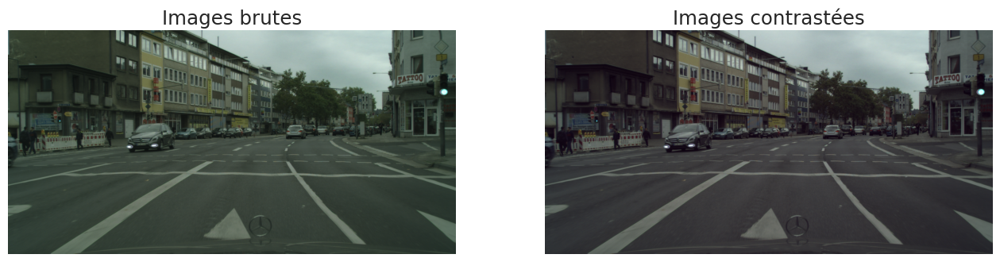

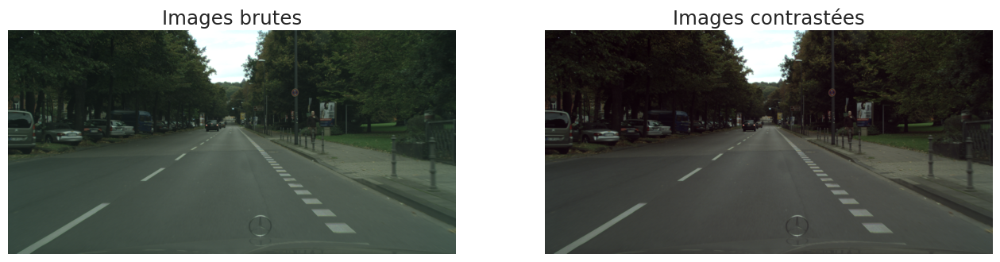

In [13]:
afficher_une_serie_d_images(
                            [ chemin_image+files_name[i] for i in range(7) ],
                            [ chemin_contraste+files_name[i] for i in range(7) ],
                            n = 2,
                            figsize = (16,8),
                            gray=False, 
                            title = ["Images brutes", "Images contrastées"]
                            )

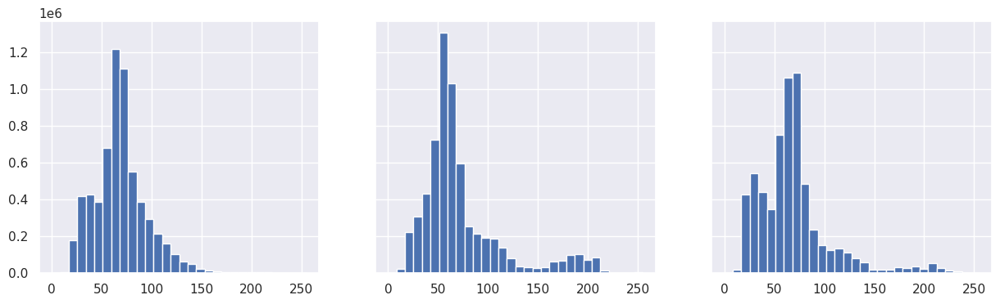

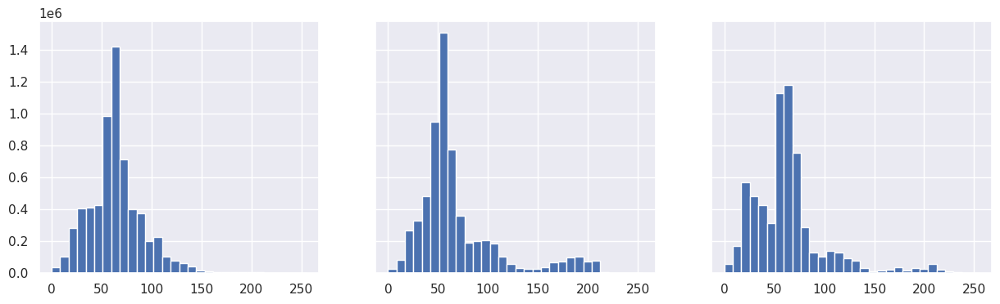

In [14]:
####################### histogramme des images brutes   ###################################

fig, ax = plt.subplots(1,3, figsize = (15,4), sharey=True)
for i in range(3) :
    ax[i].hist(np.array( image_utils.load_img(chemin_image+files_name[i+3], grayscale=False) ).ravel() , bins = 30)

plt.show()

####################### histogramme des images contrastées   ###################################

fig, ax = plt.subplots(1,3, figsize = (15,4), sharey=True)
for i in range(3) :
    ax[i].hist(np.array( image_utils.load_img(chemin_contraste+files_name[i+3], grayscale=False) ).ravel() , bins = 30)

plt.show()

# <strong> III.2 - masque coloré
    
    
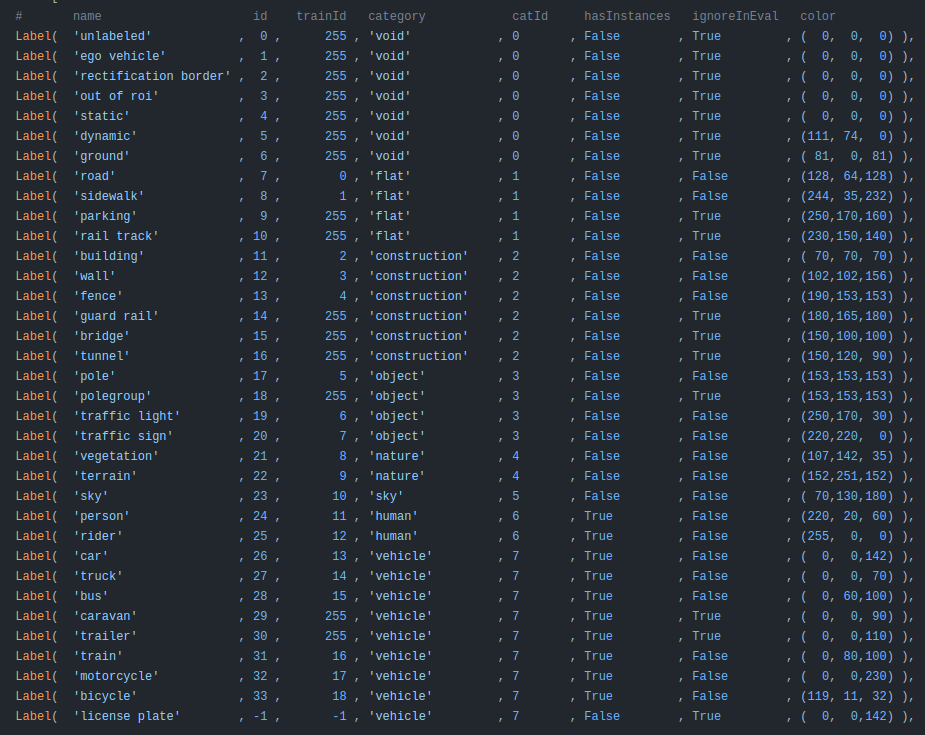
    

 ###  Chaque objet du nom de la première colonne est la belisé avec une couleur de la dernière colonne

-  ###  <strong>   Visualisation

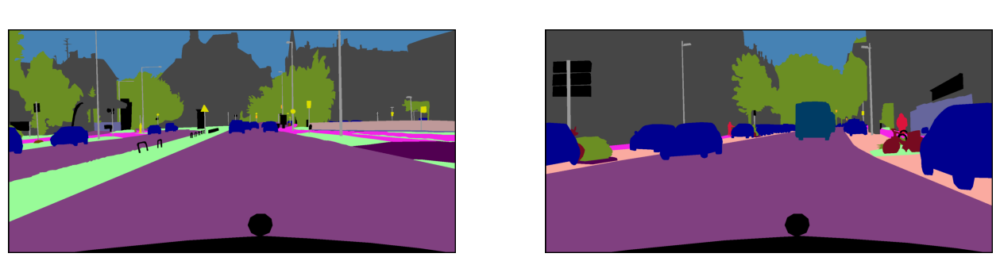

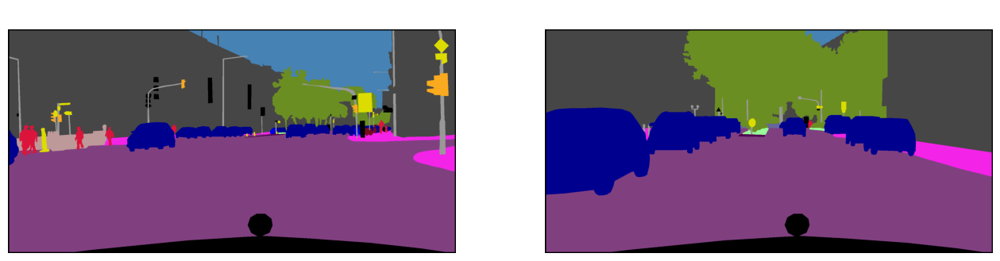

In [15]:
afficher_une_serie_d_images(
                            [ chemin_masque_color+files_name[i] for i in range(7) ],
                            [ chemin_masque_color+files_name[i+26] for i in range(7) ],
                            n = 2,
                            figsize = (16,8),
                            gray=False
                            )

 ###  Chaque object sur l'image est différentiée des autres par une couleur unique représentée en notation `RGB`

 ###  Autrement chaque pixel est un vecteur de " élements"

In [16]:
img_c = image_utils.load_img( chemin_masque_color + files_name[5])

In [17]:
img_c.mode

'RGB'

In [18]:
np.array(img_c).shape

(1024, 2048, 3)

In [19]:
uniq_color = couleurs_uniques(img_c)

In [20]:
print(f"Les couleurs uniques constituant l'image sont : \n{uniq_color} ")

Les couleurs uniques constituant l'image sont : 
['(0,0,0)', '(0,0,142)', '(0,0,230)', '(70,70,70)', '(70,130,180)', '(81,0,81)', '(102,102,156)', '(107,142,35)', '(128,64,128)', '(153,153,153)', '(190,153,153)', '(220,20,60)', '(220,220,0)', '(244,35,232)', '(250,170,30)', '(255,0,0)'] 


 ###  ces couleurs correspondent à la labelisation des objets que l'on retrouve à la dernière colenne de cette image 

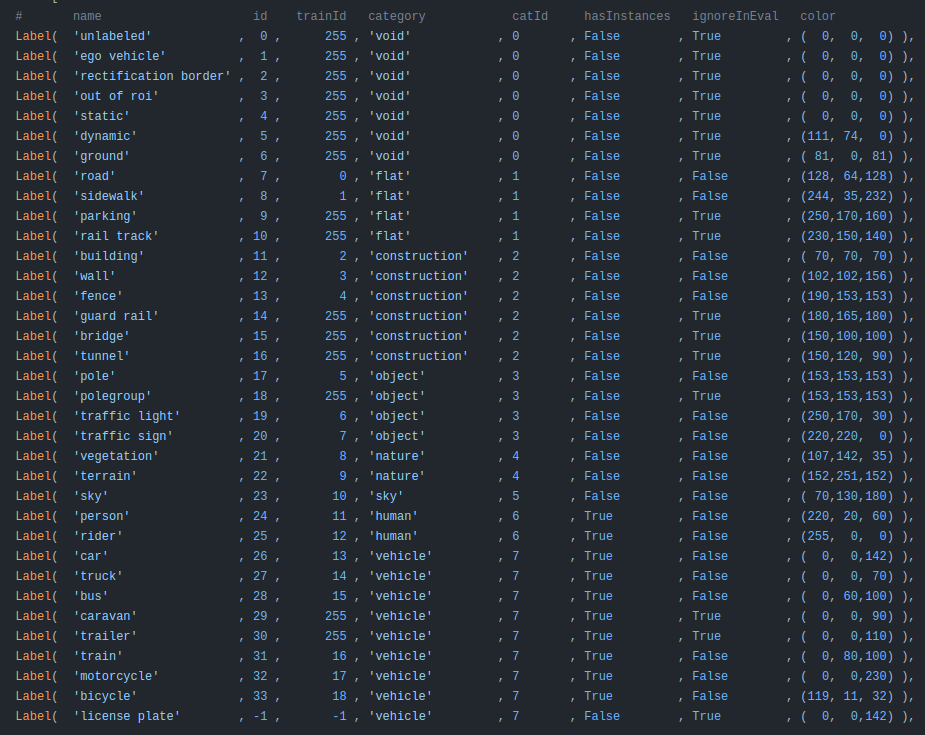

In [21]:
print(f"On en compte au total {len(uniq_color)} douleurs différentes pour cette image seule")

On en compte au total 16 douleurs différentes pour cette image seule


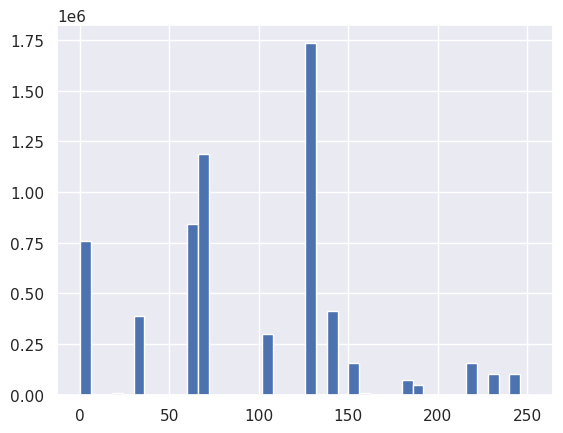

In [22]:
plt.hist( np.array(img_c ).ravel() , bins = range(0,255, 6) )
plt.show()

In [23]:
np.unique(np.array(img_c).ravel())

array([  0,  20,  30,  35,  60,  64,  70,  81, 102, 107, 128, 130, 142,
       153, 156, 170, 180, 190, 220, 230, 232, 244, 250, 255], dtype=uint8)

In [24]:
len( np.unique(np.array(img_c).ravel()) )

24

 ###  On peut voire que l'image numéro 5 est labelisée par 24 pixels de valeurs discrète repartis entre 0 et 255. Ces valeurs sont celles qui composent le vecteur couleur RGB de chaque pixel de l'image.  Il ne peuvent donc pas être utilisés pour indexer chaque label ou segment de l'image. Pour le faire, le plus simple serait d'utiliser une image en niveau de gris

 ###  Essayons de regarder cette repartition dans 200 images à notre disposition :

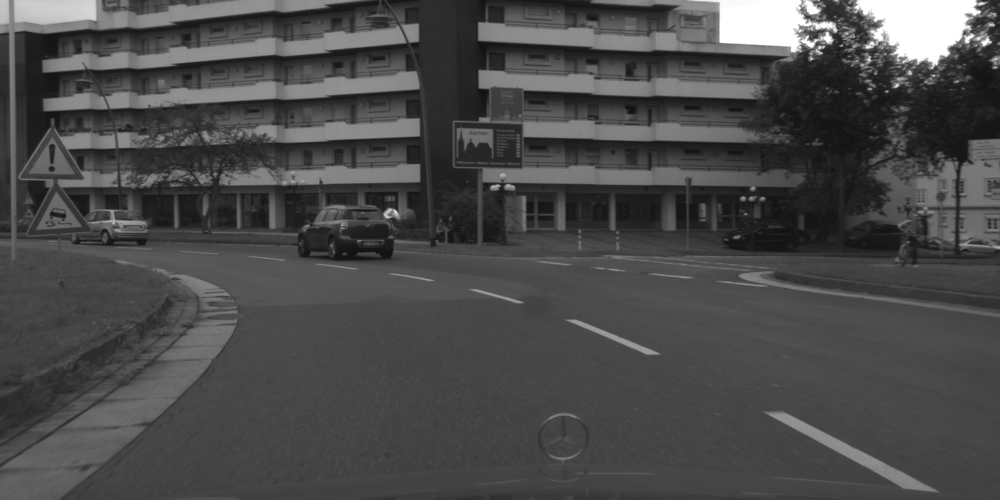

In [25]:
image_utils.load_img(chemin_image+files_name[0], grayscale=True) 

-  ###  <strong>   Nombre de pixel uniques qui encodent une <strong> image en couleur

 ###  les calculs sont réalisée uniquement sur 300 images pour des soucis de temps de calcul. 

 ###  Pour celà je trie 300 images au hasard parmi toutes les images à disposition pour faire ensuite le comptage

In [26]:
count = {}
n = 10
extract = np.random.choice(files_name, n, False)


for name in tqdm(extract) :
    v, c = couleurs_uniques(image_utils.load_img( chemin_masque_color+name ), return_counts=True)
    for i, pix in enumerate(v) :
        if pix in count.keys() :
            count[pix] += c[i]
        else :
            count[pix] = 1

100%|██████████| 10/10 [00:22<00:00,  2.26s/it]


In [27]:
couleurs_uniques(chemin_masque_color+files_name[2])

['(0,0,0)',
 '(0,0,142)',
 '(70,70,70)',
 '(70,130,180)',
 '(81,0,81)',
 '(107,142,35)',
 '(111,74,0)',
 '(119,11,32)',
 '(128,64,128)',
 '(152,251,152)',
 '(153,153,153)',
 '(190,153,153)',
 '(220,20,60)',
 '(220,220,0)',
 '(244,35,232)',
 '(250,170,30)']

In [28]:
print(f"Le nombre total de couleurs distinctes est de {len(count)}" )

Le nombre total de couleurs distinctes est de 20


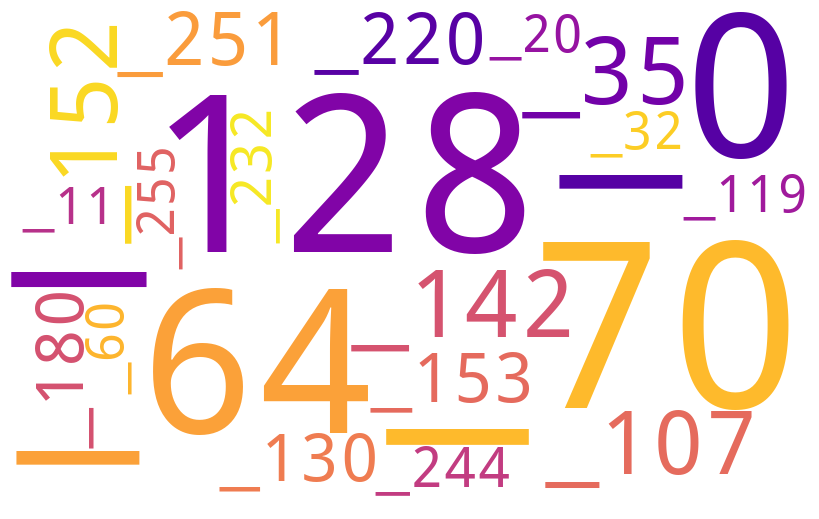

In [29]:
build_number_cloud = True

if build_number_cloud :
    world_and_number_cloud_show( np.array(image_utils.load_img(chemin_masque_color+files_name[0])) , do_mask=False , save_name = "worldcoud_gray1.png")
else :
    afficher_les_images_supperposees(image_utils.load_img("worldcoud_gray1.png"), style=1 )

-  ###  <strong>    Nombre de pixel uniques qui encodent une image en niveau de gris

In [30]:
count = {}
n = 200
extract = np.random.choice(files_name, n, False)


for name in extract :
    v, c = np.unique(image_utils.load_img( chemin_masque_color+name , grayscale=True), return_counts=True)
    for i, pix in enumerate(v) :
        if pix in count.keys() :
            count[pix] += c[i]
        else :
            count[pix] = 1

In [31]:
print(f"Le nombre total de pixels distincts est de {len(count)}" )

Le nombre total de pixels distincts est de 27


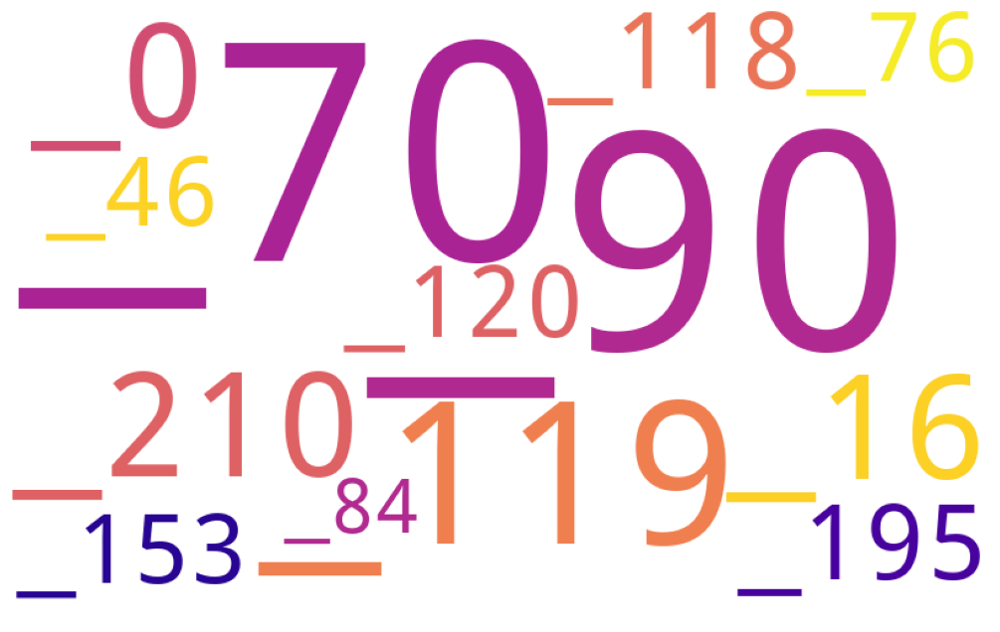

In [32]:
build_number_cloud = False

if build_number_cloud :
    world_and_number_cloud_show( np.array(image_utils.load_img(chemin_masque_color+files_name[0], grayscale=True)).ravel(), do_mask=False , save_name = "worldcoud_gray2.png") 
else :
    afficher_les_images_supperposees( image_utils.load_img("worldcoud_gray2.png"), style=1 )

 ###  on constate que le Number_cloud de l'image en niveau de gris est moins dense que celui de l'image en couleur.

 ###  Ce qui traduit la densité de pixels sur l'image en fonction du mode de représentation sélectionné. On peut en conclure qu'il faut moins de pixels pour représenter une image lorque celle ci est codé sur un format classique nois sur blanc.

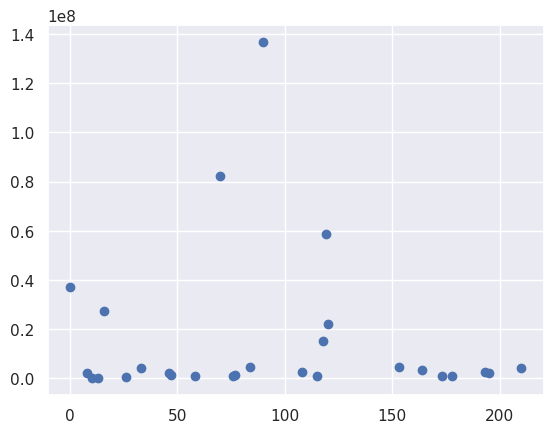

In [33]:
plt.scatter(count.keys(), count.values())
plt.show()

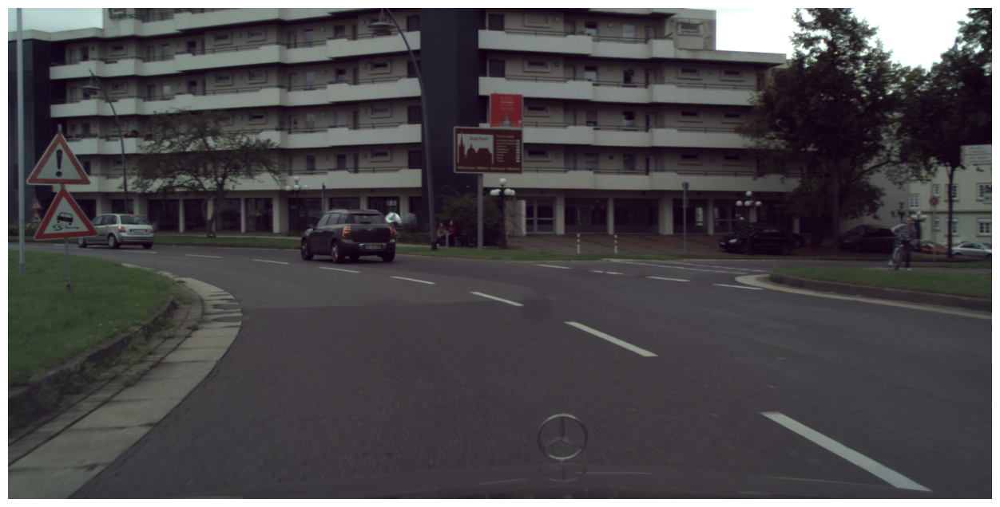

In [34]:
afficher_les_images_supperposees(chemin_contraste+files_name[0],chemin_masque_color+files_name[0], style = 1, alpha=0.4, figsize = (18,6))

# <strong> III.3 - masque InstancesIds
    

In [35]:
img_inst = image_utils.load_img(chemin_masque_instanceIds+files_name[0] )

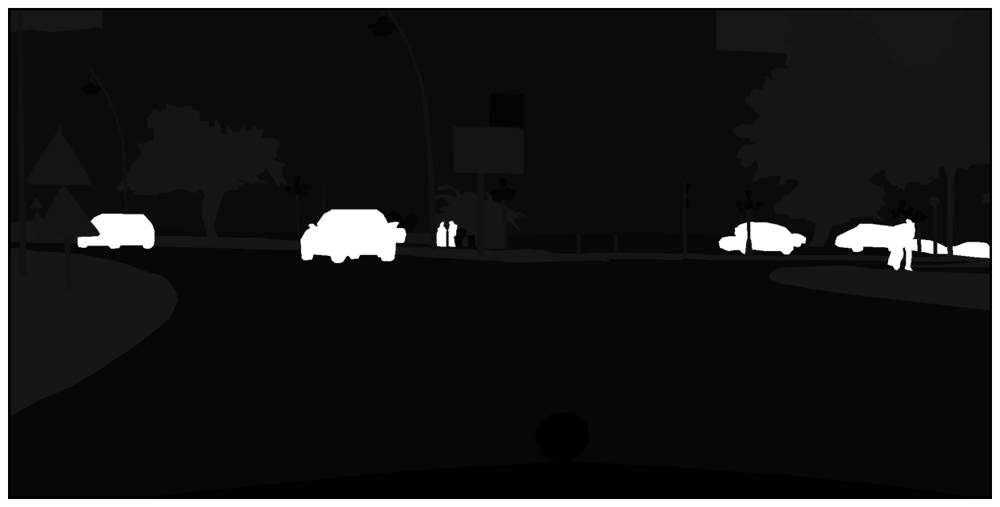

In [36]:
afficher_les_images_supperposees(img_inst)

In [37]:
img_inst.mode

'RGB'

In [38]:
np.array(img_inst).shape

(1024, 2048, 3)

-  ###  <strong>   Pixels uniques

In [39]:
np.unique( img_inst) 

array([  0,   1,   3,   4,   7,   8,  11,  17,  20,  21,  22,  23, 255],
      dtype=uint8)

In [40]:
np.unique(np.array(img_inst)[:,:,0] )

array([  0,   1,   3,   4,   7,   8,  11,  17,  20,  21,  22,  23, 255],
      dtype=uint8)

In [41]:
np.unique(np.array(img_inst)[:,:,1] )

array([  0,   1,   3,   4,   7,   8,  11,  17,  20,  21,  22,  23, 255],
      dtype=uint8)

In [42]:
np.unique(np.array(img_inst)[:,:,2] )

array([  0,   1,   3,   4,   7,   8,  11,  17,  20,  21,  22,  23, 255],
      dtype=uint8)

-  ###  <strong>   Couleurs uniques

In [43]:
uniq_color = couleurs_uniques(img_inst)
uniq_color

['(0,0,0)',
 '(1,1,1)',
 '(3,3,3)',
 '(4,4,4)',
 '(7,7,7)',
 '(8,8,8)',
 '(11,11,11)',
 '(17,17,17)',
 '(20,20,20)',
 '(21,21,21)',
 '(22,22,22)',
 '(23,23,23)',
 '(255,255,255)']

In [44]:
len(uniq_color)

13

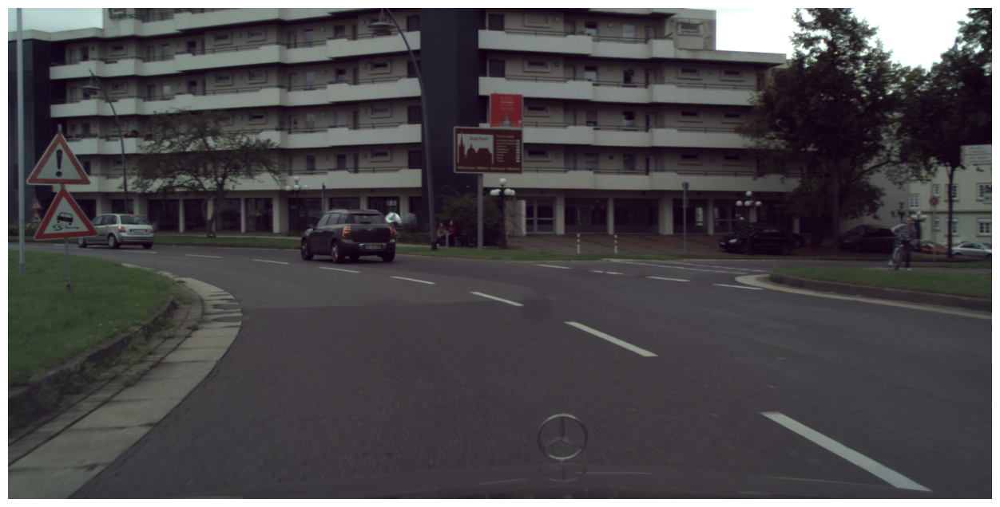

In [45]:
afficher_les_images_supperposees(  chemin_contraste+files_name[0] , chemin_masque_instanceIds+files_name[0], alpha= 0.5)

-  ###  <strong>   histogramme des pixels

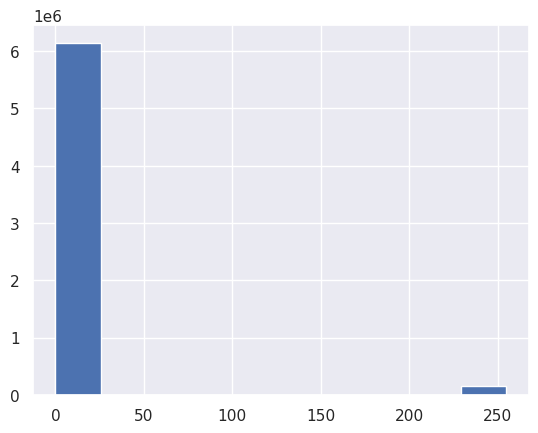

In [46]:
plt.hist( np.array(img_inst ).ravel() )
plt.show()

 ###  On remarque une forte concentration de poids de pixels entre 0 et 25 et une autre faible partie autour de 250
 
 ### Petit zoom sur ces régions

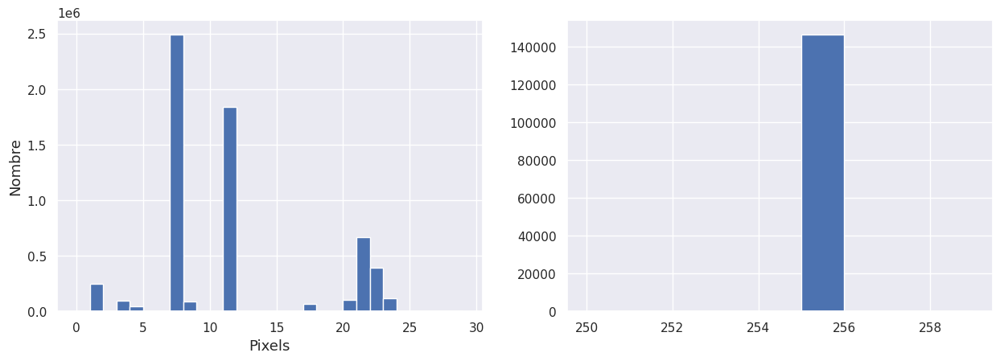

In [47]:
fig, ax = plt.subplots(1,2, figsize = (15,4.7))

ax[0].hist( np.array(img_inst ).ravel(), bins=range(0,30) )
ax[1].hist( np.array(img_inst ).ravel(), bins=range(250,260) )
ax[0].set_xlabel("Pixels", size=  13)
ax[0].set_ylabel("Nombre", size=  13)
plt.show()

 ###  Le pixel 255 est celui qui labelise les voitures et les personnes et les voitures.

 ###  Les autres pixels sont situés 200 unités plus bas. C'est ce qui explique que sur les images les voitures et les personnes paraissent plus clairs que les autres objets labélisés qui sont quand à elle plus sombre à cause de leurs valeurs de pixels très faibles

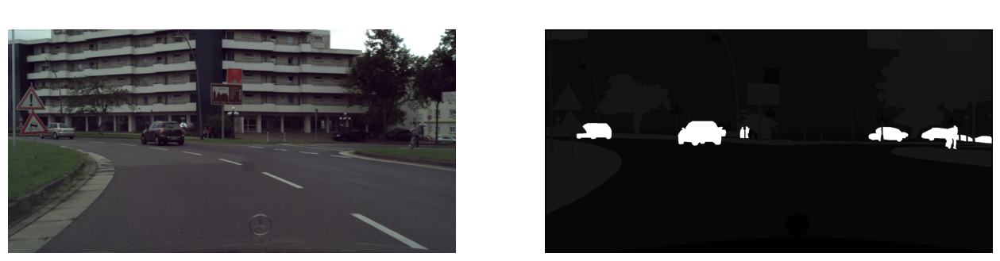

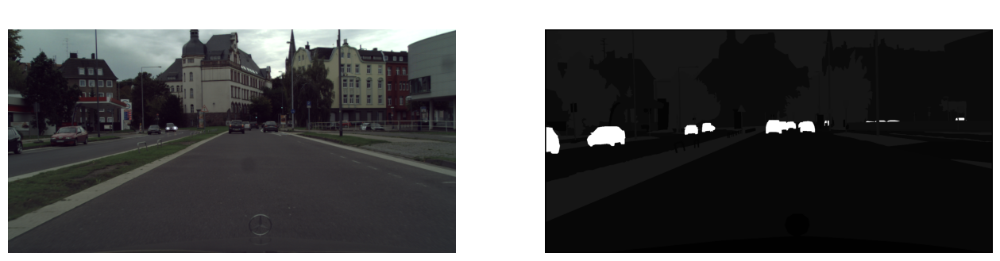

In [48]:
afficher_une_serie_d_images( [chemin_contraste+files_name[i] for i in range(5)],[chemin_masque_instanceIds+files_name[i] for i in range(5)] , n = 2)

In [49]:
count = {}
n = 300
extract = np.random.choice(files_name, n, False)

for name in extract :
    v, c = np.unique(image_utils.load_img( chemin_masque_instanceIds+name , grayscale=False), return_counts=True)
    for i, pix in enumerate(v) :
        if pix in count.keys() :
            count[pix] += c[i]
        else :
            count[pix] = 1

In [50]:
print(f"Le nombre total de pixels distincts est de {len(count)}" )

Le nombre total de pixels distincts est de 30


In [51]:
x = np.array([i for i in count.keys()] )
y = np.array([i for i in count.values()] )
temp = np.argsort(x)
x = x[temp]
y = y[temp]

In [52]:
x

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  32,  33, 255], dtype=uint8)

In [53]:
y

array([    35581,  86191459,  24230047,  28375699,  26089210,   5776366,
        16597174, 628155418,  99417217,   7428670,   3257065, 370415698,
        16781836,  18254500,         1,   5357902,      1831,  21350041,
          113362,   3753931,   9347980, 264138256,  19787575,  72499333,
          426310,      3235,    649678,         1,   1505515, 150571282])

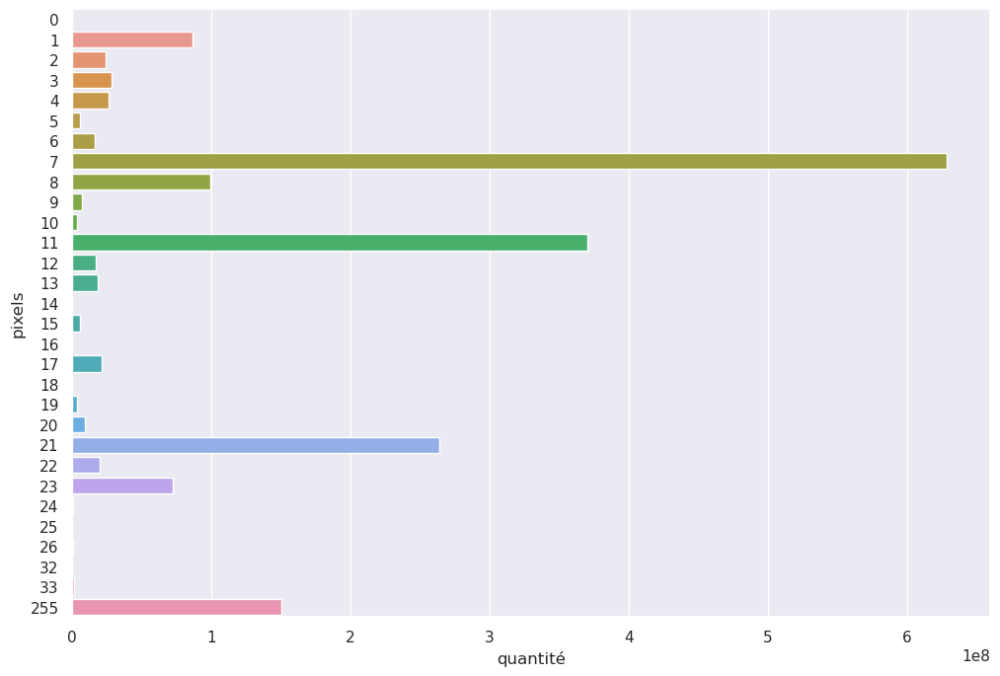

In [54]:
plt.figure(figsize=(12,8))
sns.barplot(pd.DataFrame({"pixels":x, "quantité":y}), x="quantité", y="pixels", orient="h")
plt.show()

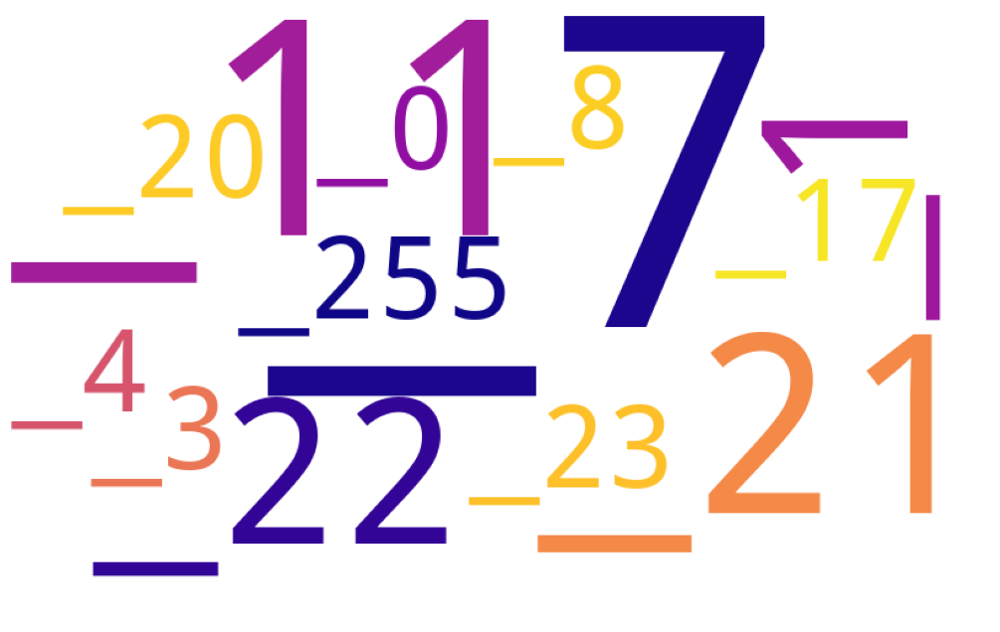

In [55]:
build_number_cloud = False

if build_number_cloud :
    world_and_number_cloud_show( np.array(image_utils.load_img(chemin_masque_instanceIds+files_name[0], )).ravel(), do_mask=False , save_name = "worldcoud_gray3.png") 
else :
    afficher_les_images_supperposees(image_utils.load_img("worldcoud_gray3.png"))

# <strong> III.4 - masque labelIds
    

In [56]:
img_labl = image_utils.load_img(chemin_masque_labelIds + files_name[0] , grayscale=True)

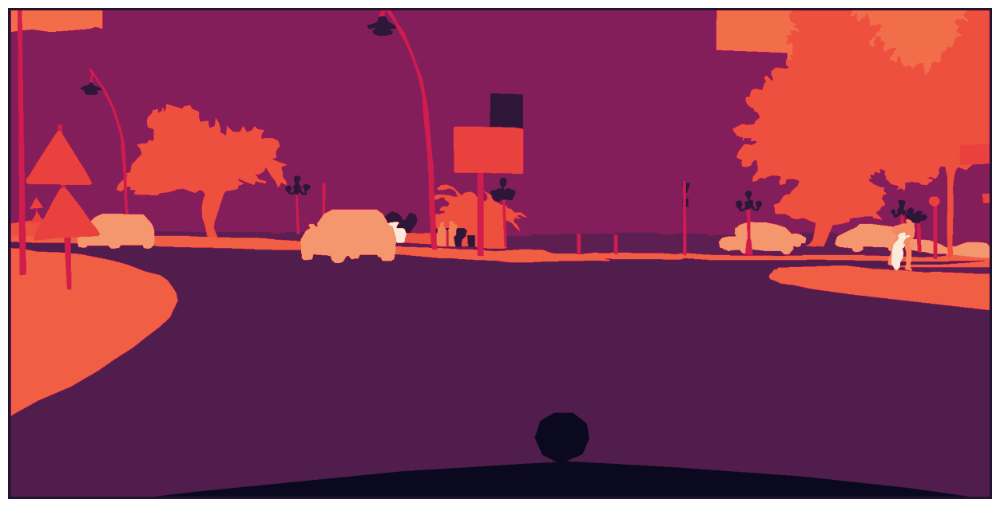

In [57]:
afficher_les_images_supperposees(img_labl)

In [58]:
img_labl.mode

'L'

In [59]:
np.unique(img_labl)

array([ 0,  1,  3,  4,  7,  8, 11, 17, 20, 21, 22, 23, 24, 25, 26, 33],
      dtype=uint8)

-  ###  <strong>   distribution de pixels

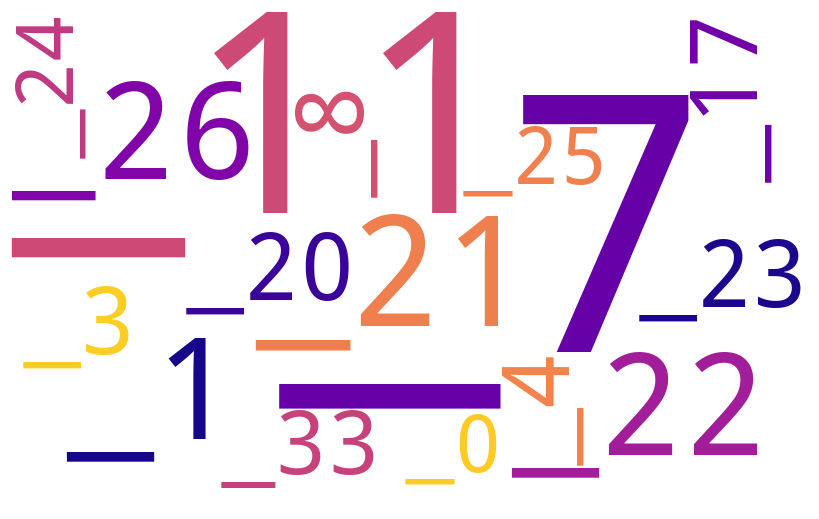

In [60]:
world_and_number_cloud_show(np.array(img_labl) )

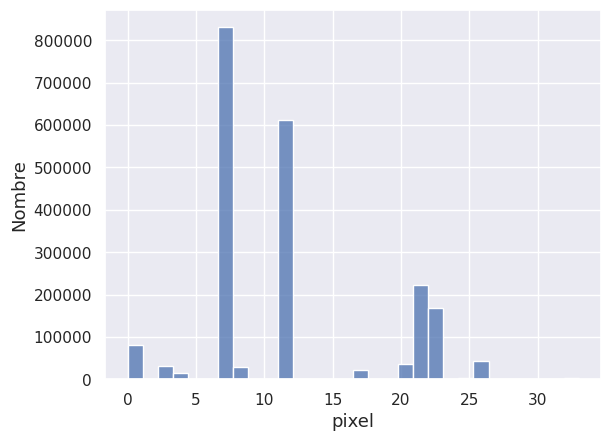

In [61]:
sns.histplot( np.array(img_labl).ravel(), bins = 30 )
plt.xlabel("pixel", size = 13)
plt.ylabel("Nombre", size = 13)
plt.show()

-  ###  <strong>   dénombrement de pixels uniques sur un échantillon de 300 images

In [62]:
count = {}
n = 200
extract = np.random.choice(files_name, n, False)

for name in extract :
    v, c = np.unique(image_utils.load_img( chemin_masque_labelIds+name , grayscale=True), return_counts=True)
    for i, pix in enumerate(v) :
        if pix in count.keys() :
            count[pix] += c[i]
        else :
            count[pix] = 1

In [63]:
print(f"Le nombre total de pixels distincts est de {len(count)}" )

Le nombre total de pixels distincts est de 34


In [64]:
count.keys()

dict_keys([1, 3, 4, 7, 8, 11, 12, 17, 19, 20, 21, 24, 25, 26, 33, 0, 13, 22, 23, 5, 9, 28, 6, 2, 32, 15, 27, 18, 31, 29, 14, 10, 16, 30])

In [65]:
x = np.array([i for i in count.keys()] )
y = np.array([i for i in count.values()] )
temp = np.argsort(x)
x = x[temp]
y = y[temp]

In [66]:
x

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33],
      dtype=uint8)

In [67]:
y

array([     5860,  19271541,   5631449,   6295167,   5693812,   1341903,
         6008329, 139007558,  19764855,   2396941,    602825,  80205795,
         2271444,   2922815,     21788,   1637521,     97315,   4512622,
           22272,    833850,   2323290,  61864623,   4668974,  14539959,
         4908606,    830537,  23527509,   1347786,    852697,    108256,
           96549,    833468,    345437,   1946942])

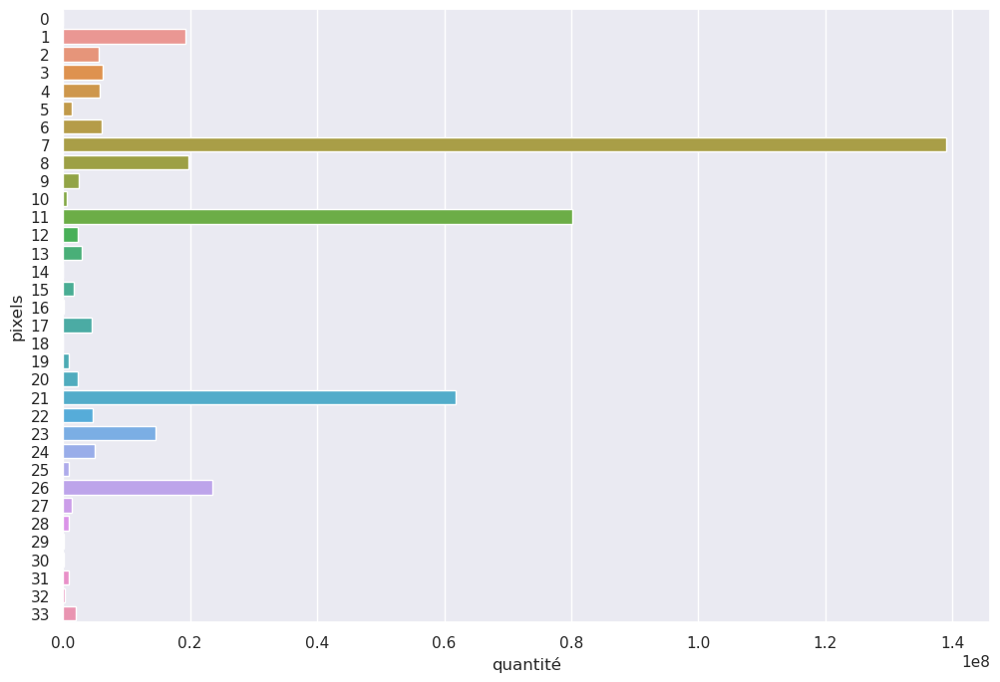

In [68]:
plt.figure(figsize=(12,8))
sns.barplot(pd.DataFrame({"pixels":x, "quantité":y}), x="quantité", y="pixels", orient="h")
plt.show()

# <strong> IV - Encodages applicables sur les images
    

## On peut remarquer que les images sont composés de 34 pixels qui prennent toutes les valeurs possibles entre 0 et 33

## Cela corresponds à l'encodage des objets de l'image par les `id` de la deuxième colonne de notre image

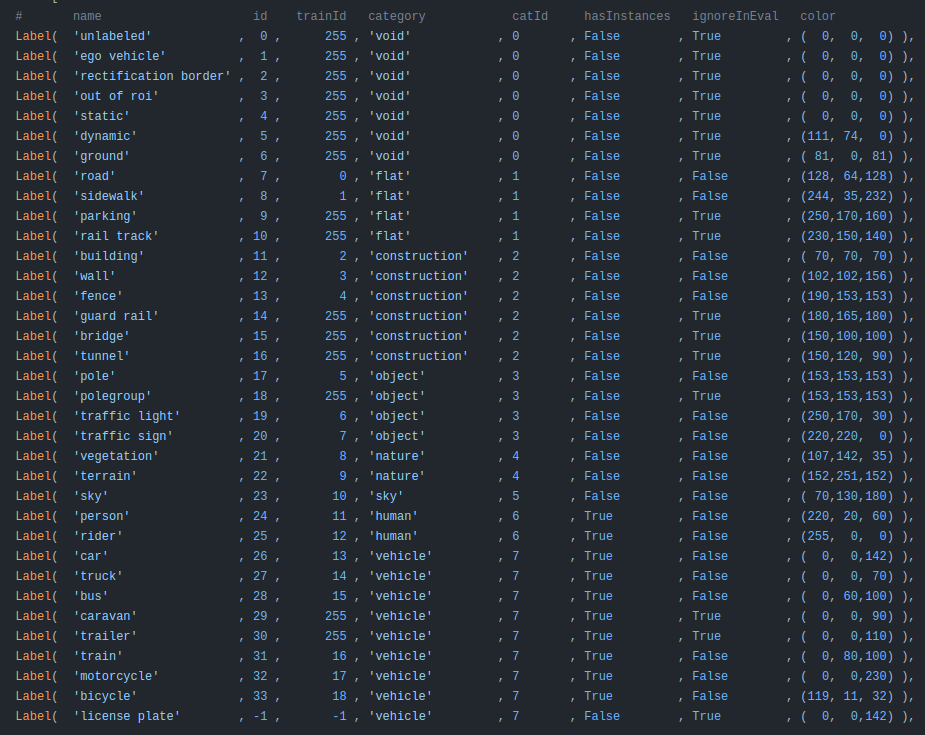

###  Le diagramme en barre permet de voire que le pixel numéro `7` pour `road` ou `route` est le plus représenté sur les images. Ce qui est tout à fait normal car chaque images contient au moins une route

### En associant la deuxième colonne `id` et la quatrième colonne `category` de photo ci-dessus il est possible de regrouper les objets de l'image ne 8 catégories distinctes à savoir :
 - ### void
 - ### flat
 - ### construction
 - ### object
 - ### sky
 - ### human
 - ### vehicule
 
### Ce regroupement en 8 catégories peut se faire grace à l'utilisation de la classe ci-dessous définie :

In [69]:
class Mask_To_8_Groups(BaseEstimator,TransformerMixin):

    """
        Description :
        ---------------
        
        Cette classe prends transforme une matrice de taille (n,m) en un tenseur de configuration (n,m,k) où k est le nombre de catégories 
        suivant la troisième dimension k, les composantes sont des vecteurs qui One hot Encode les pixels présents sur la matrice de départ

        D'une certaine façon celà équivaut à un One hot Encode des différentes valeurs de pixels présents sur la matrice de départ d'où la
        troisième dimension k qui a pour valeur le nombre de categories

        Author : 
        -----------
            Name : Brice KENGNI ZANGUIM
            e-mail : kenzabri2@yahoo.com
    """
    ########################################################################################################
    #############        catégorie de groupage par defaut. L'utilisateur peut  fournir         #############
    ############# une autre catergorisation de groupage lors de l'instantiation de la Classe   #############
    categorie_par_defaut =  {
                    'void': [0, 1, 2, 3, 4, 5, 6],
                    'flat': [7, 8, 9, 10],
                    'construction': [11, 12, 13, 14, 15, 16],
                    'object': [17, 18, 19, 20],
                    'nature': [21, 22],
                    'sky': [23],
                    'human': [24, 25],
                    'vehicle': [26, 27, 28, 29, 30, 31, 32, 33, -1]
                }
    
    #############################################################################################################
    #############  Palette de couleurs par defaut pour les classes si l'on veut que chaque classe   #############
    #############  soit représentée par une couleur bien spécifique en RGB. Les couleurs doivent    #############
    #############    suivre le même ordre de definition que dans le dictionnaire de catégories      #############
    palette_couleur_par_defaut =[ 'ivory', 'lightgrey', 'plum', 'olive', 'forestgreen', 'skyblue', 'orangered', 'navy']
    
    def __init__( self, categorie = None, palette_couleur = None):
        ############################################################################################################
        #############  Si une categorisation est fournie lors de l'instantiation alors je l'utilise    #############
        if categorie :
            assert isinstance(categorie, dict)
            self.categorie = categorie
        
        ###################################################################################
        #############  Sinon j'utilise plutot une categorisation par defaut   #############
        else :
            self.categorie = Mask_To_8_Groups.categorie_par_defaut
        self.nom_des_categories = self.categorie.keys()
        self.numero_des_categories = np.array(range(len(self.categorie)) )
        if np.all(palette_couleur) :
            self.palette_couleur = palette_couleur
            assert len(self.palette_couleur) == len(self.categorie)
        else :
            self.palette_couleur = Mask_To_8_Groups.palette_couleur_par_defaut
        

    def fit( self, categorie, palette_couleur = None ):
        self.categorie = categorie
        self.nom_des_categories = categorie.keys()
        self.numero_des_categories = np.array(range(len(self.categorie)) )
        
        if np.all( palette_couleur ) :
            self.palette_couleur = palette_couleur
            assert len(self.palette_couleur) == len(self.categorie)

    
    def transform(self ,img ,y = None ):
        img = np.array( img ) 
        
        #############################################################################
        ############# Initialisation d'un masque de taille (n ,m ,k )   #############
        mask = np.zeros( (img.shape[0], img.shape[1], len( self.nom_des_categories ) ) ) 
        
        ####################################################################################################
        ############# je parcours toute la liste des identifiants `Id` des différents objets   #############
        for Id in range(-1, 34):
            ####################################################################################################
            #############     Je parcours toute la liste des noms de catégories d'objets afin de    ############
            #############   rechercher la catégorie qui associée à l'Id et créer le canal associé   ############
            for pos, cat in enumerate(self.nom_des_categories) :
                if Id in self.categorie[cat]:
                    #mask[:, :, pos] = np.logical_or(mask[:, :, pos], img == Id )
                    mask[:, :, pos][img == Id] = 1
                    break

        return mask
    
    def fit_transform ( self ,img ,categorie = None )  :
        if categorie :
            self.fit( categorie )
        
        return self.transform(img)
    
    def invers_transform( self, mask ) :
        """
        Prends le masque en entrée et reconstruit l'image d'origine au format noir sur blanc
        La petite nuance est qu'il y a à présents autant de niveaux de pixels que de groupes associés à la transformation
        l'image n'est donc pas ramenée au 34 groupes initiaux qui apparaissaient sur l'image originale mais au nombre de 
        groupes réduis associés à la transformation; soit 8 groupes pas defaut.  Pour remontrer aux 34 groupes de départ 
        il faurdrait une astuce plus ingénieuse.
        """
        
        #img = np.zeros((mask.shape[0], mask.shape[1]))
        ###############################################################################################################
        ################  Je me crèe un vectoriser qui donne le pouvoir à une fonction de pouvoir          ############ 
        ################  se transformer en une fonction vectorielle multidimension definie de E vers E    ############ 
        #f = np.vectorize(lambda x: self.numero_des_categories[x] )
        
        ############################################################################################################################
        ####################  Ma fonction vectorielle prends toutes les indexes où se trouvent les maximum              ############ 
        ####################  dans la troisième dimension et y retourne la position le numero de categori  équivalent   ############ 
        if mask.ndim == 3 and mask.shape[-1] == 8 : 
            return np.argmax(mask, axis=2)    # Ceci tire profit du fait que les numéro de catégories sont ordonnés à partir de 0
        
        elif mask.ndim == 3 and mask.shape[-1] == 3  :  # Images au format RGB
            output_mask = np.zeros(mask.shape[0]* mask.shape[1])
            x = mask.reshape((-1,3))
            for classe, couleur in enumerate(self.palette_couleur) :
                output_mask[ np.prod(x == colors.to_rgb( couleur ), axis = 1, dtype=bool) ] = classe
                
            
            return output_mask.reshape((mask.shape[0],mask.shape[1] ))
        
        #return  f( np.argmax(mask, axis=2)  )
        
    def fit_transform_to_specific_color_set(self,mask, palette_couleur = None ) :
        if palette_couleur : self.palette_couleur = palette_couleur
        
        ##################################################################################################################
        ###############  J'initialise à zéro tous les éléments de l'image RGB qui seras renvoyé en sorti    ##############
        img_rgb = np.zeros((mask.shape[0], mask.shape[1], 3), dtype= float)
                        
        if np.ndim( mask ) == 3 :
            ###################################################################################################################
            ###########    Avant toute chose on se rassure que la profondeur du masque ( sa troisième dimenssion)     #########
            ###########          a la même longueur que le dictionnaires des classes (  nombre de classe )            #########
            # assert mask.shape[-1] == len( self.categorie ) # Uniquement que si la fonction invers_transform ne prends pas les images RGB
            
            ##############################################################################################################
            ###########    Je ramène mon masque de 3 dimensions à un masque de 2 dimension (niveau de gris )     #########
            mask = self.invers_transform(mask)
        
        assert np.ndim(mask) == 2
        for cats in np.unique(mask) :
            for i in [0,1,2] :
                img_rgb[:,:,i][ mask == cats ] = colors.to_rgb( self.palette_couleur[cats] )[i]
        
        return img_rgb
        
        ###Pour chaque cétégorie, donne la valeur de la couleur du pixel (pour R, G et B)
        ###for cat in range(len(self.categorie)):
        ###    for i in [0,1,2] :
        ###        img_rgb[:, :,i] += mask[:, :, cat] * colors.to_rgb(colors_palette[cat])[i]
            

-  ###  <strong>   test de transformation sur une image

In [70]:
cats = {
 'void': [0, 1, 2, 3, 4, 5, 6],
 'flat': [7, 8, 9, 10],
 'construction': [11, 12, 13, 14, 15, 16],
 'object': [17, 18, 19, 20],
 'nature': [21, 22],
 'sky': [23],
 'human': [24, 25],
 'vehicle': [26, 27, 28, 29, 30, 31, 32, 33, -1]}

In [71]:
mask_tranformer = Mask_To_8_Groups( cats)

In [72]:
img_transf = mask_tranformer.transform(img_labl)

In [73]:
img_transf.shape

(1024, 2048, 8)

In [74]:
np.array(img_labl).shape

(1024, 2048)

 ###  On voie bien que l'image de départ qui était sur 2 dimension est transformée en une de 3 dimensions avec 8 composantes sur sa troisième dimension

In [75]:
np.unique(img_transf)

array([0., 1.])

 ###  La nouvelle image est bien composée uniquement de 0 et de 1

 ###  Si je spécifie une nouvelle catégorisation avec uniquement 5 catégories au lieu de 8 alors la matrice fournie sera de taille 5 sur sa troisième composante

In [76]:
cats = {'void': [0, 1, 2, 3, 4, 5, 6],
 'flat': [7, 8, 9, 10],
 'human': [24, 25],
 'vehicle': [26, 27, 28, 29, 30, 31, 32, 33, -1]}

In [77]:
mask_tranformer.fit_transform(img_labl, cats).shape

(1024, 2048, 4)

 ###  Cette transformation trouvera son importance plutard lors de l'entrainement des modèle car attibuer chaque segment/objet de l'image à une pixel de valeur 0, 1 , 2 , . . . 7 introduit une relation d'ordre entre les différentes catégories et pourtant la réalité ne semble pas indiquer une relation d'ordre entre des humain et des vehicules par exemple.
 
 ### Pour resoudre ce problème il faut associer à chaque label/groupe/objet de l'image, un masque sur lequel les pixels ont les valeurs 1 quand ils ( les pixels ) représentent l'objet et 0 sinon.
 
###  Une autre façon de le voire est de considérer chaque image images comme la supperposition de plusieurs images, chacune représentant les différentes position d'un seul label

### L'illustration est faite ci-dessous

In [78]:
cats = {
 'void': [0, 1, 2, 3, 4, 5, 6],
 'flat': [7, 8, 9, 10],
 'construction': [11, 12, 13, 14, 15, 16],
 'object': [17, 18, 19, 20],
 'nature': [21, 22],
 'sky': [23],
 'human': [24, 25],
 'vehicle': [26, 27, 28, 29, 30, 31, 32, 33, -1]}

In [79]:
img_transf = mask_tranformer.fit_transform(img_labl, cats)

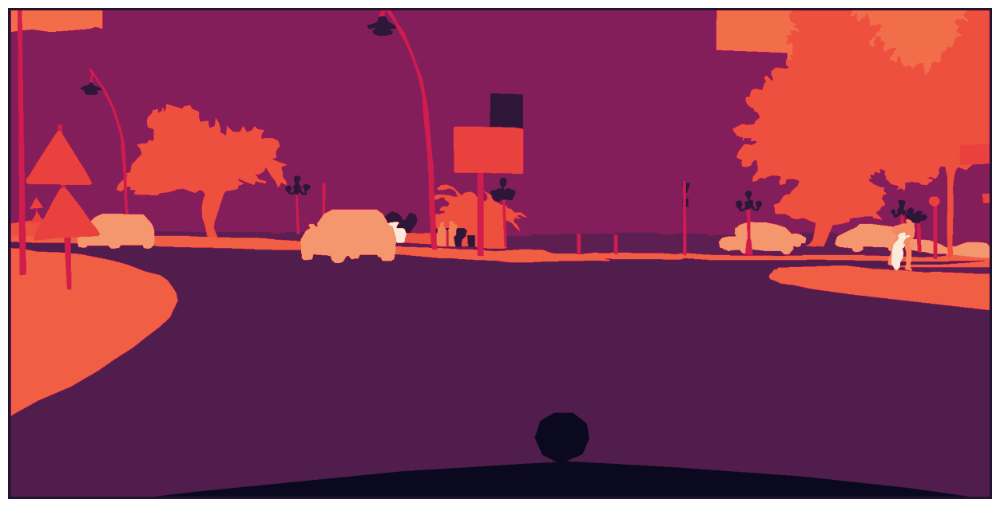

In [80]:
afficher_les_images_supperposees(img_labl )

 ###  L'image ci  dessous est la supperposition des masques qui vont suivre :

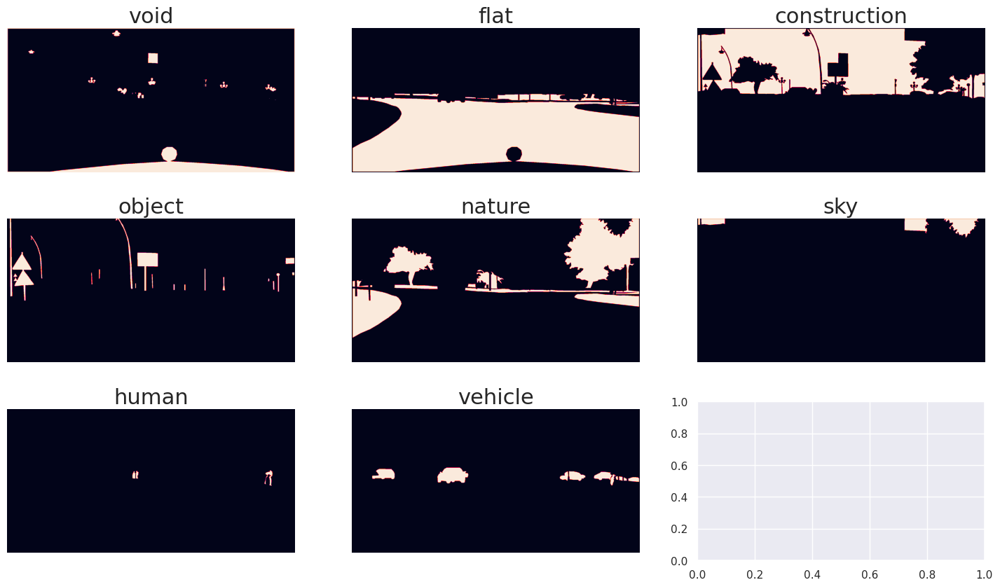

In [86]:
nombre_d_images = 8
nbr_colonnes = 3

fig, ax = plt.subplots(  math.ceil(nombre_d_images/nbr_colonnes) ,  nbr_colonnes  ,figsize = (18,abs(60/nbr_colonnes-10)) )

for i, cat in enumerate( mask_tranformer.nom_des_categories ) :
    ax[i//nbr_colonnes,i%nbr_colonnes].imshow(img_transf[:,:,i] )
    ax[i//nbr_colonnes,i%nbr_colonnes].grid( False )
    ax[i//nbr_colonnes,i%nbr_colonnes].axis( False )
    ax[i//nbr_colonnes,i%nbr_colonnes].set_title( cat, size= 22 )

plt.show()

###   Avec la methode `invers_transform` je peux retrouver l'image originale par une transformation inverse de mon masque à 8 canaux

In [87]:
img_inverse = mask_tranformer.invers_transform( img_transf )

In [88]:
img_inverse

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [89]:
img_inverse.shape

(1024, 2048)

In [90]:
np.unique(img_inverse)

array([0, 1, 2, 3, 4, 5, 6, 7])

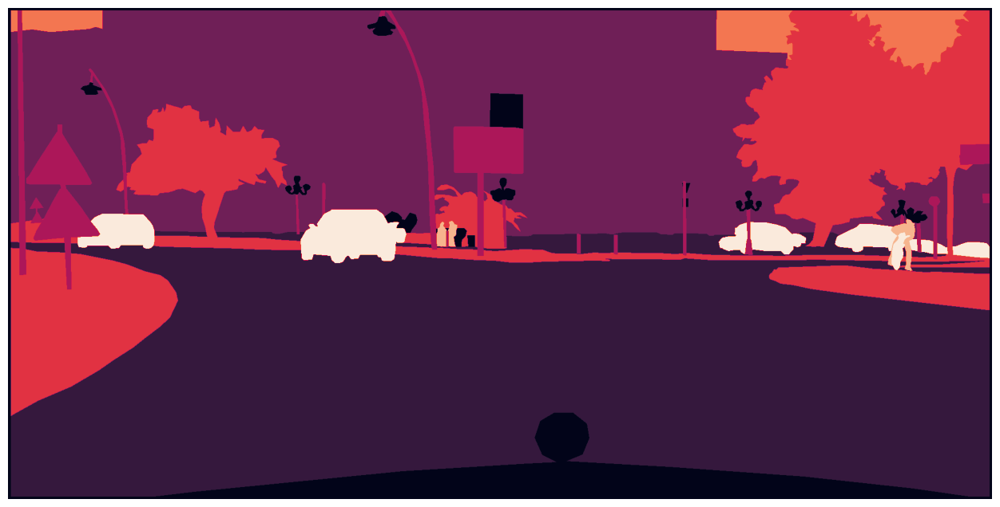

In [91]:
afficher_les_images_supperposees( img_inverse )

### Je peux l'afficher dans une gamme de couleur spécifique

In [92]:
color = ["pink", "green", "yellow", "blue", "orange", "magenta", "red", "navy"]

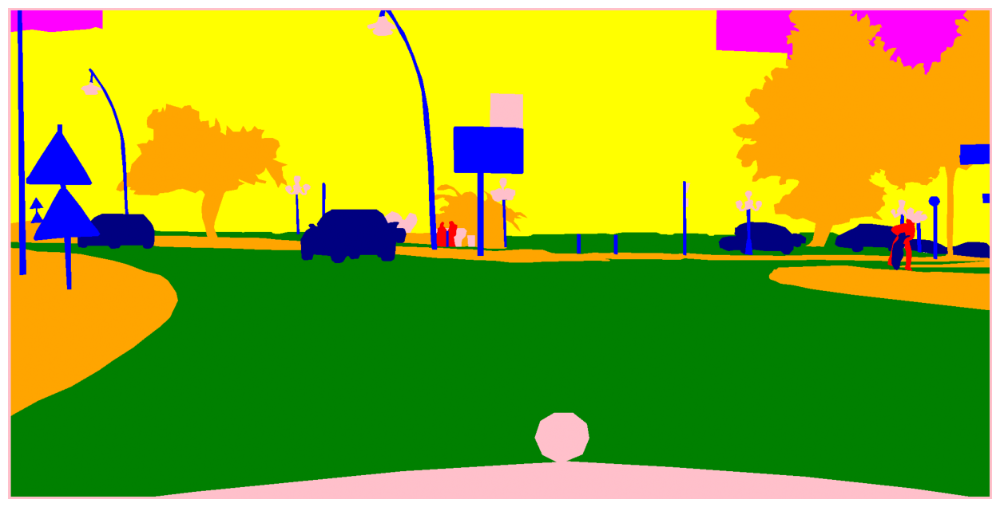

In [93]:
afficher_les_images_supperposees(mask_tranformer.fit_transform_to_specific_color_set( img_inverse , color) )

### Ou dans la gamme de couleur par defaut

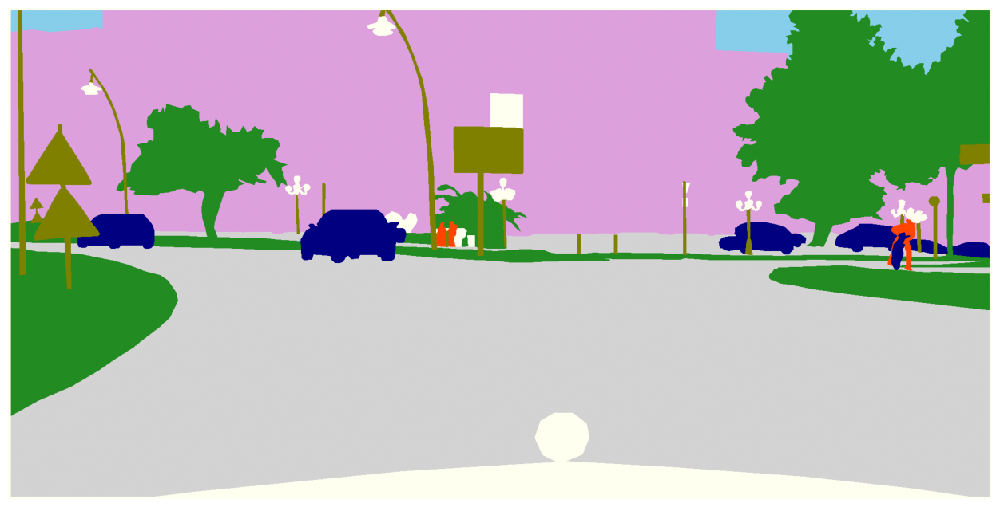

In [87]:
afficher_les_images_supperposees(mask_tranformer.fit_transform_to_specific_color_set( img_inverse, Mask_To_8_Groups.palette_couleur_par_defaut ) )

# <strong> V - Classe pour la génération automatique des données à de la phase d'entrainement
    

### reférence : https://deeplylearning.fr/cours-pratiques-deep-learning/realiser-son-propre-generateur-de-donnees/

### La plupart du temps lorsqu'on voudrait entrainer un modèle de deep learnin, regression linéaire ou de machine learning, on a pour habitude de charger au préalable toutes nos données d'entrainement dans des variables `X_train`,`Y_train`,`X_test`,`Y_test` . . . Cette approche necessite (pour des donées volumuneuses) d'avoir de l'espaca mémoire disponible par tout temps au niveau de la RAM car les données sont stockées temporairement dans la RAM et prêt à être utilisées à tout moment. Celà a parfois pour conséquence de "ralentir" l'ordinateur voir dans certains cas faire planter la machine à tel point que la seule solution soit d'appuyer sur le boutton "off" de l'ordinateur.

### Ce problème peut être contourné ou du moins résolu en utilisant une approche qui va moins solliciter la mémoire de l'ordinateur en allant charger les données uniquement quand le besoin se présente. l'astuce consiste à charger et envoyer les données au modèle par des petits paquets de données de taille `batch`. Ainsi donc les données ne sont pas transmises au modèle en une seule fois mais lui parviennet par des petits bouts à chaque ittération.

### Un parallèle peut être fait avec le comportement corpusculaire de la lumière : Selon une certain vision non unique, les échanges d'énergie ou d'informations entre la lumière et la matière se font non pas en continu mais mais par de petits bouts de certains objets communement appelés `photons`. Ces échanges ont lieu à une fréquence tellement élevée de l'ordre de la femto seconde que l'on a l'impression qu'ils se font en continue : de la même façon que la lumière interagit avec de la matière par petit bouts, dans l'approche suivante nos données interagissent avec notre modèle par petits paquets

In [88]:
class MyImagesGenerator ( keras.utils.Sequence ):
    
    def __init__( self, chemin_image, chemin_masque, batch_taille, shuffle =False, taille_des_donnees = None, dimension_des_images = None,
                    augmentation = False, aug_batch_size = 2, aug_nb_batch = 2, cats = None, mask_transformer=None, target_size = None): 
        """
            La fonction permet d'initialiser les attributs d'instances de l'instance de classe nouvellement déclarée

            Paramètres :
            ---------------
                chemin_image, chemin_masque  : Str 
                    Chemin d'accès aux images et aux masques associés. Il est important de terminer la définition des chemin par le caractère "/"
                    Si celà n'est pas respecté le programme effectue une correction automatique sur les chemins concernés.
                batch_taille : int 
                    Taille d'un paquet de données (batch)
                shuffle : Boolean
                    Grandeur booléenne qui permet de spécifier si on doit modifier l'ordre de rangement des données qui seront transmises au modèle
                    de Deep Learning. Les valeurs admises sont "True" et "False"
                dimension_des_images : tuple
                    Un tuple qui défini les dimensions des images si elles doivent être redimensionnés ou non. Si aucune valeur n'est spécifiée
                    alors les images sont utilisées sans être redimensionnées
                cats : dict
                    dictionnaire des catégories de regroupement des classes si ce dernier. S'il n'est pas foruni alors la classification utilisée
                    par defaut est celle en 8 groupes spécifié sur le site https://www.cityscapes-dataset.com/dataset-overview/
                    Voire la classe Mask_To_8_Groups() pour plus de détails.
                taille_des_donnees : int
                    Nombre de couple ( image , masque ) a retenir parmi la liste disponible dans les dossiers indiqués par les chemins
                augmentation : Bool
                    Précise si une augmentation des données doit être faite ou non
                aug_batch_size, aug_nb_batch : int
                    respectivement la taille et le nombre de batch à générer dans la classe d'augmentation de données afin de réduire le temps de
                    génération des images et masques augmentés
                    
            return : dict
            ---------------
                None

            Author : 
            -----------
                Name : Brice KENGNI ZANGUIM
                e-mail : kenzabri2@yahoo.com
        """
        #########################################################################
        ######################  Préparation des données  ########################
        if chemin_image[-1] != "/" : chemin_image += "/"
        if chemin_masque[-1] != "/" : chemin_masque += "/"
        
        ######################################################################################################
        ########################  Il faut vérifier que les masques et les images ne ##########################
        ########################       sont pas logés dans le même repertoire     ############################ 
        assert chemin_image != chemin_masque
        
        self.chemin_image = chemin_image
        self.chemin_masque = chemin_masque
        
        #####################################################################################################
        #############  Les fichier correspondants images et masque doivent avoir le même nom  ###############
        #############  On se rassure que les fichiers masques et images on les mêmes noms     ###############
        
        self.files_name = np.array( [ i for i in os.listdir(self.chemin_image) if ".png" in i] )
        assert sorted(self.files_name) == sorted([ i for i in os.listdir(self.chemin_masque) if ".png" in i] )
        
        if taille_des_donnees :
            self.files_name = np.random.choice( self.files_name , taille_des_donnees, replace = False )
            
        ###############################################################################
        ###############    Definition des indexes d'accès aux données    ##############
        self.indexes = np.arange(len(self.files_name))
        
        ######################################################
        #################      DIVERS      ###################
        self.batch_taille = batch_taille
        self.shuffle = shuffle
        self.dimension_des_images = dimension_des_images
        self.augmentation = augmentation
        self.aug_batch_size = aug_batch_size
        self.aug_nb_batch = aug_nb_batch
        
        if target_size : 
            self.target_size = target_size
        else :
            self.target_size = (256,512)
        
        ###############################################################################
        ###############   Transformer pour la transformation du masque   ##############
        if mask_transformer : 
            self.mask_transformer = mask_transformer
        else :
            self.mask_transformer = Mask_To_8_Groups( Mask_To_8_Groups.categorie_par_defaut )
        
        ################################################################################################
        ##############     Je lance un premier appel à la fonction on_epoch_end() pour     #############
        ##############    randomiser l'ordre des données, ceci en créant de l'aléatoire    #############
        ##############     à l'ordre de primaire de la variable d'instance "indexes"       #############
        self.on_epoch_end()
        
    def __len__(self) :
        """
        Permet de définir le nombre de batch qui seront transmis au modèle durant l'itération. Le calcul se base sur la taille totale 
        des données et la taille d'un batch.
        
        En un sens, si j'ai 100 images à passer à mon modèle durant une itération et que la taille du batch est de 3 alors on aura en tout
        100//3 batchs ou paquets de 3 items chacun qui seront constitués et envoyés progressivement au modèle 
        """
        ###################################################################################################################################
        ############## Je retourne le nombre de requête de batch qui doivent être effectués à chaque itération ou epoch  ##################
        if self.augmentation :
            return int( np.ceil( len(self.files_name) /self.batch_taille ) )  # *(self.aug_batch_size*self.aug_nb_batch+1)
        else :
            return int( np.ceil( len(self.files_name)/self.batch_taille ) )
        
    def __getitem__(self, index) :
        """
        C'est cette fonction qui est appelée chaque fois que necessaire lorsque le modèle a besoin d'un nouveau batch de donnée
        Elle est appelée avec un argument "index" qui spécifie l'ordre du batch. Par exemple lors du premier appel de la fonction pendant 
        l'entrainement du modèle, index prends la valeur 0, pour le second batch index prends la valeur 1 et ainsi de suite.
        """
        if index == self.__len__() - 1 : 
            position_dans_la_liste_de_donnees = self.indexes[ index*self.batch_taille : ]
        else :
            position_dans_la_liste_de_donnees = self.indexes[ index*self.batch_taille : (index+1)*self.batch_taille ]
        
        #images, mask = [], []
        #for idx in position_dans_la_liste_de_donnees :
        #     images.append( np.array( image_utils.load_img( self.chemin_image+ self.files_name[idx] ) ) )
        
        ###############################################################################################
        ############  Je charge les images, ensuite je les transforme en une matrice    ###############
        ############  np.array() et pour finir j'ajoute le tout à la liste des images   ###############
        images = [ 
                    np.array( 
                              image_utils.load_img( self.chemin_image + name, target_size = self.target_size ) , dtype= 'uint8'
                             )  
                      for name in self.files_name[ position_dans_la_liste_de_donnees ] 
                 ]

        ################################################################################################
        ############  Je charge les masques, ensuite je les transforme en une matrice    ###############
        ############  np.array() et pour finir j'ajoute le tout à la liste des images    ###############            
        masks = [ 
                 np.array( 
                          image_utils.load_img(self.chemin_masque + name, grayscale=True, target_size=self.target_size ) , dtype= 'uint8'
                         )  
                    for name in self.files_name[ position_dans_la_liste_de_donnees ]
               ]
        
        ########################################################
        ############  Augmentation des images    ###############
        if self.augmentation : 
            augmenter = AugmentationImagesEtMask( images , masks, batch_size=self.aug_batch_size , nb_batch= self.aug_nb_batch ,  )
            images, masks = augmenter.transform()
        
        #################################################################
        ############  encodage des masque en 8 classes    ###############
        masks = [  self.mask_transformer.transform( i )   for i in masks ]        
        
        ##########################################################################################
        ########   Je remodifie l'ordre des données du batch et les renvoie au modèle   ##########
        x = np.arange(len(images))
        np.random.shuffle(x)       # mélangeur
        return np.array(images)[x] , np.array(masks)[x]
        
    def on_epoch_end( self ) :
        """
        Cette fonction est appelée à la fin de chaque itération.
        Elle peut entre autre permettre de définir la façon dont les données seront transmises aux modèles. Supposons que lors de l'itération actuelle
        les items 1 et 3 faisaient parti d'un même batch, on peut s'arranger pour que lors de l'itération suivante ces deux items soient transmis au 
        modèle dans deux batch distinct; par exemple l'item 1 étant trans mis via le deuxième batch et l'item 3 est transmis via le dixième batch.
        
        Cette opération est rendue possible modifiant l'ordre dans lequel les items sont rangés entre deux itération; un peu comme si on mélangéait
        des cartes dans un jeux de cartes. Celà permet de réduire les effets du batch sur les résultats de l'entrainement du modèle.
        
        La fonction trouve surtout son importance lorsqu'il faut
        """
        if self.shuffle  :
            np.random.shuffle(self.indexes)


-  ###  <strong>   test de fonctionnement du générateur de données
    
### Tout d'abord je vais créer une nouvelle instance de la classe fraichement definie plus haut

In [101]:
x = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, True, augmentation=False, taille_des_donnees = 30 )

### Je peux ensuite vérifier la disponibilité des différents méthodes et attributs de ma nouvelle instance

### Le chemin d'accès aux images

In [102]:
x.chemin_image

"/media/brice_kengni_zanguim/Samsung_T5/OC_Form/OC - P8 - Participez à la conception d'une voiture autonome/datas/images/"

### Le chemin d'accès aux masques

In [103]:
x.chemin_masque

"/media/brice_kengni_zanguim/Samsung_T5/OC_Form/OC - P8 - Participez à la conception d'une voiture autonome/datas/masque_labelIds/"

### La liste des noms d'images et de masques

In [104]:
x.files_name

array(['tubingen_000085_000019.png', 'stuttgart_000005_000019.png',
       'lindau_000049_000019.png', 'munster_000046_000019.png',
       'frankfurt_000001_027325.png', 'stuttgart_000084_000019.png',
       'bremen_000078_000019.png', 'zurich_000014_000019.png',
       'bremen_000053_000019.png', 'ulm_000038_000019.png',
       'stuttgart_000175_000019.png', 'dusseldorf_000211_000019.png',
       'hamburg_000000_088197.png', 'hamburg_000000_057487.png',
       'frankfurt_000001_066092.png', 'hanover_000000_049465.png',
       'zurich_000025_000019.png', 'aachen_000014_000019.png',
       'strasbourg_000001_051134.png', 'hanover_000000_018800.png',
       'munster_000014_000019.png', 'aachen_000058_000019.png',
       'bremen_000171_000019.png', 'hanover_000000_006355.png',
       'erfurt_000024_000019.png', 'hamburg_000000_101724.png',
       'bremen_000169_000019.png', 'jena_000017_000019.png',
       'ulm_000011_000019.png', 'hamburg_000000_041667.png'], dtype='<U33')

### Les différentes indexes de posisionnement dans la liste des noms d'images et de masques

In [105]:
x.indexes 

array([23,  1, 27, 21, 19,  2, 22,  8, 25, 20,  9, 10, 16, 17, 18, 11,  7,
       15,  3,  0, 12,  6, 28,  5, 26,  4, 14, 24, 13, 29])

### La taille d'un batch

In [106]:
x.batch_taille

10

### Le nombre d'appels de batchs qui seront réalisés  étant donné la taille du batch defini

In [107]:
x.__len__()

3

### Le transformer de masque   en 8 groupes

In [108]:
x.mask_transformer

Mask_To_8_Groups(categorie={'construction': [11, 12, 13, 14, 15, 16],
                            'flat': [7, 8, 9, 10], 'human': [24, 25],
                            'nature': [21, 22], 'object': [17, 18, 19, 20],
                            'sky': [23],
                            'vehicle': [26, 27, 28, 29, 30, 31, 32, 33, -1],
                            'void': [0, 1, 2, 3, 4, 5, 6]},
                 palette_couleur=['ivory', 'lightgrey', 'plum', 'olive',
                                  'forestgreen', 'skyblue', 'orangered',
                                  'navy'])

### Je peux ensuite acquerir les images et masques du premier batch 

In [109]:
%%time
img_gen, mask_gen = x.__getitem__(0)

CPU times: user 1.06 s, sys: 12.3 ms, total: 1.07 s
Wall time: 1.62 s


In [110]:
img_gen.shape

(10, 128, 256, 3)

In [111]:
mask_gen.shape

(10, 128, 256, 8)

In [112]:
np.unique(mask_gen[0])

array([0., 1.])

-  ###  <strong>  Je reçois ainsi une liste de 7 images de taille 1024*2048 en couleur RGB et 7 masque de même taille avec 8 canaux, chacun des canaux étant associé à une classe d'images

###  Pour afficher les images je peux appliquer une transformation inverse sur les masque afin de les mettre en niveaux de gris et ensuite les afficher avec les images associées

In [113]:
%%time
mask_gen_inv = np.array([ x.mask_transformer.invers_transform(mask) for mask in mask_gen ])

CPU times: user 5.67 ms, sys: 3.84 ms, total: 9.51 ms
Wall time: 7.93 ms


In [114]:
mask_gen_inv.shape

(10, 128, 256)

In [115]:
np.unique(mask_gen_inv[0])

array([0, 1, 2, 3, 4, 5, 6, 7])

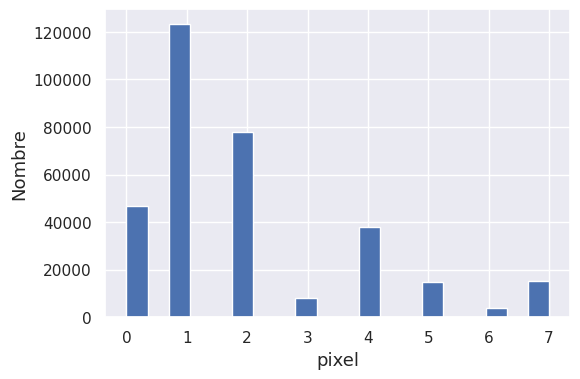

In [116]:
plt.figure(figsize=(6,4))
plt.hist( mask_gen_inv.ravel(), 'sturges' )  #'auto', 'fd', 'doane','scott', 'stone', 'rice', 'sturges', or 'sqrt'
plt.xlabel("pixel", size = 13)
plt.ylabel("Nombre", size = 13)
plt.show()

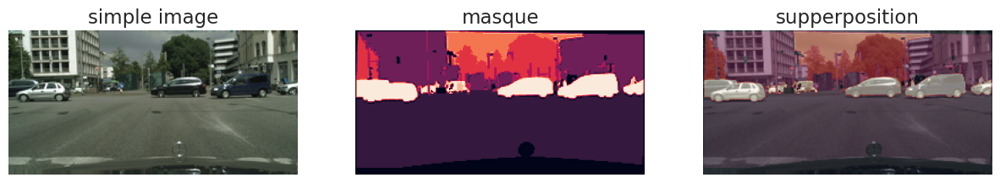

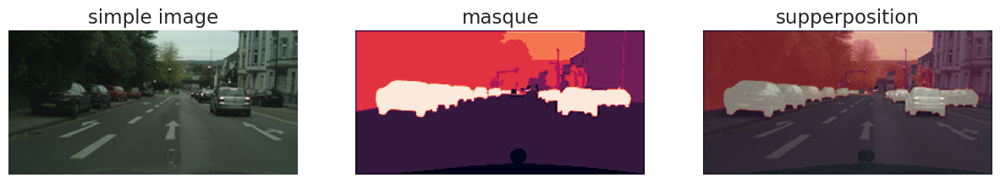

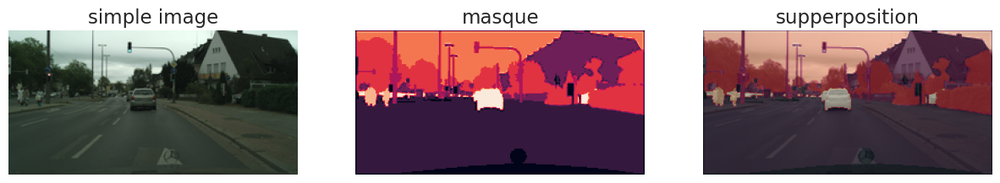

In [118]:
for i in range(img_gen.shape[0]%2+ 3) :
    afficher_les_images_supperposees( img_gen[i], np.array(mask_gen_inv[i] ),3, alpha=.5 )

-  ###  <strong>  On peut tout aussi choisir de représenter les classes dans une autre gamme de couleur comme la gamme predefinie dans la classe de transformer

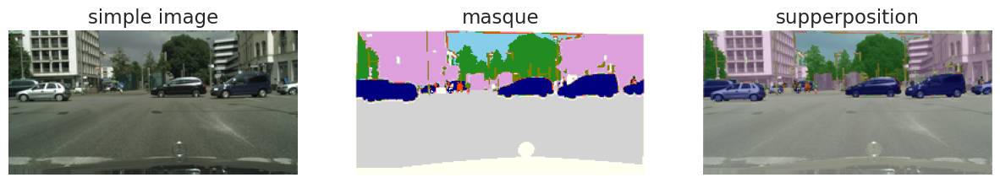

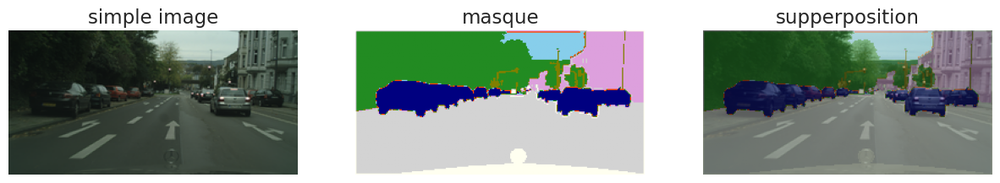

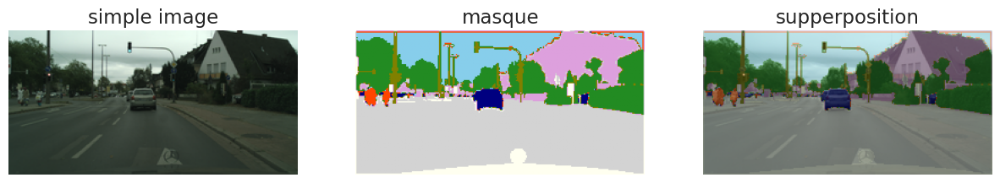

In [120]:
for i in range(img_gen.shape[0]%2+ 3) :
    afficher_les_images_supperposees( img_gen[i], mask_tranformer.fit_transform_to_specific_color_set(mask_gen[i], Mask_To_8_Groups.palette_couleur_par_defaut ),3, alpha=.4 )

-  ###  <strong>  Ou encore dans une gamme que nous aurions nous même definie

In [121]:
color = [ "magenta","pink", "blue", "navy", "orange", "green", "red", "yellow"]

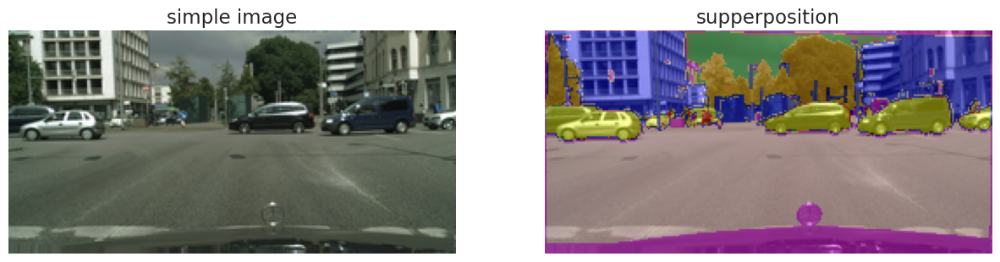

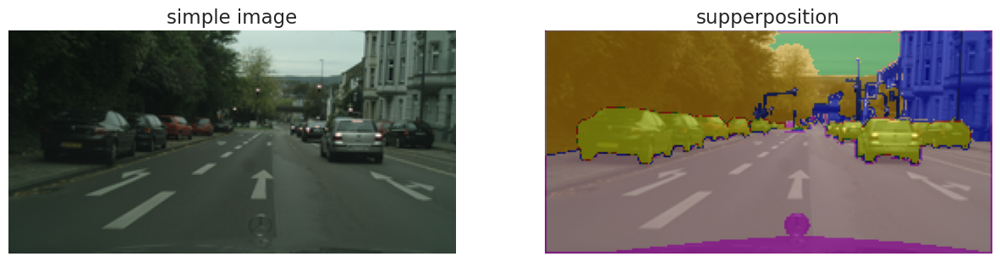

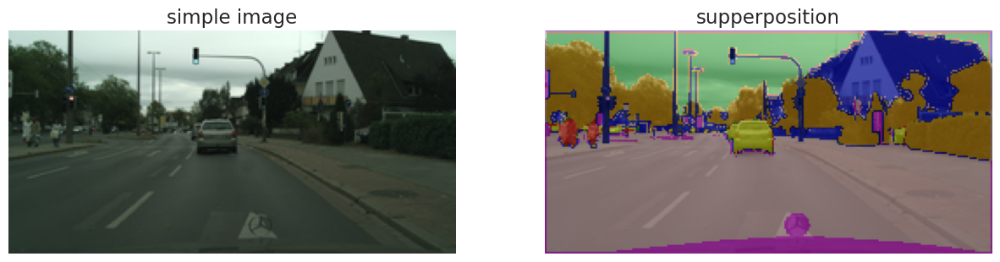

In [122]:
for i in range(img_gen.shape[0]%2+ 3) :
    afficher_les_images_supperposees( img_gen[i], mask_tranformer.fit_transform_to_specific_color_set(mask_gen[i],color ),2, alpha=.4 )

# <strong> V - Aumentatation des données

### Très souvent il arrive qu'on ne dispose pas de suffisament de données pour l'entrainement de notre modèle.
### Il peut arriver qu'on ne dispose à l'immédiat que d'une base de données réduite : 20~100 images par exemples.

### Une solution pour résoudre ce problème d evolume de données est d'en fabriquer de nouvelles à partir des images dont on dispose.

### A supposer que je ne dispose que de l'image suivante :

In [123]:
img = image_utils.load_img(chemin_image+files_name[25])
mask = image_utils.load_img(chemin_masque_color+files_name[25])

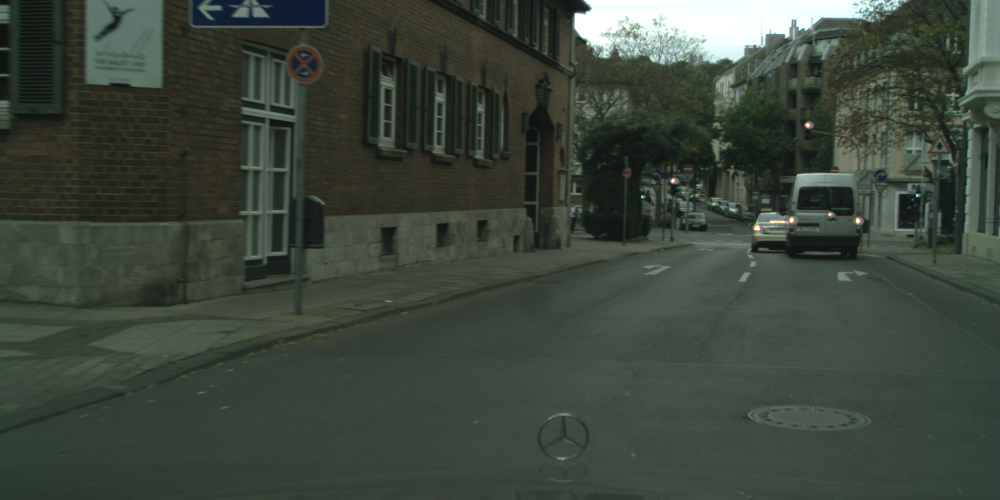

In [124]:
img

### Et je décide d'y éffectuter des modifications par exemple en appliquant une opération d'équalisation, qui va tenter d'uniformiser la disrtibution des pixels sur l'image :

In [125]:
img_eq = np.array(PIL.ImageOps.equalize( img) )

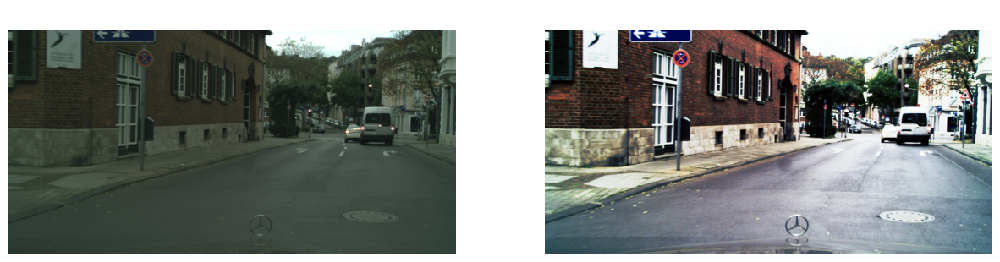

In [126]:
afficher_les_images_supperposees(img,img_eq , style=2 , alpha = 1, title="  ")

### Ou encore de l'appliquer un filtre gaussien :

In [127]:
img_gauss = img.filter( PIL.ImageFilter.GaussianBlur(5) )

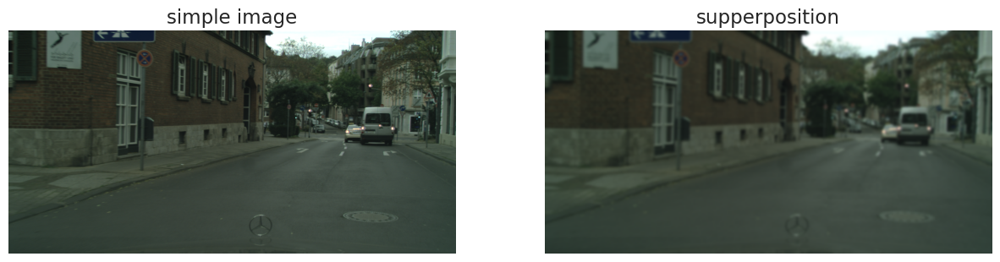

In [128]:
afficher_les_images_supperposees(img,img_gauss , 2 , alpha = 1,)

### Ou même un filtre median :

In [129]:
img_med = img.filter( PIL.ImageFilter.MedianFilter(5) )

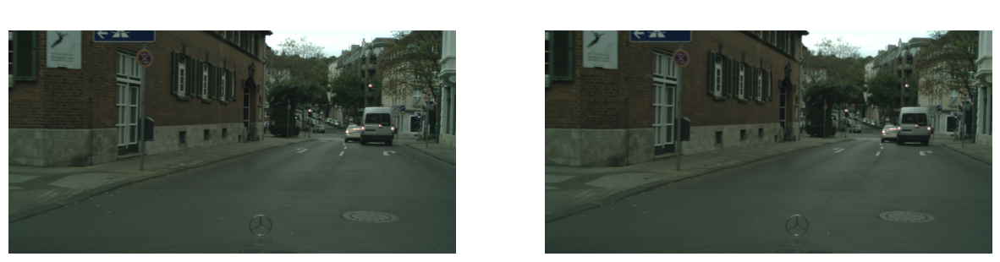

In [130]:
afficher_les_images_supperposees(img, img_med, 2 , alpha = 1, title="  ")

### <strong> Concrètemement le résultat de chacune de ces opérations sur l'image va sera de fabriquer une nouvelle image différente de l'image originale car les valeurs de pixels sur l'image auront étés modifiés
    
### On peut le vérifier en regardant la distribution de leurx pixels :

In [131]:
img == img_eq

False

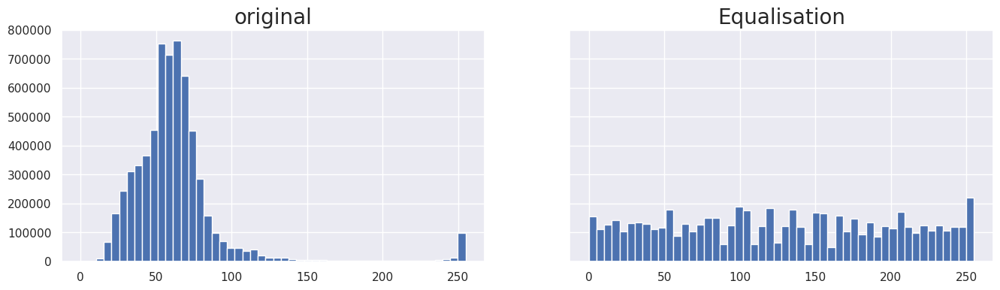

In [132]:
fig, ax = plt.subplots(1,2, figsize = (16,4), sharey=True)

ax[0].hist(np.array(img).ravel() , bins = 50 )
ax[1].hist(np.array(img_eq).ravel() , bins = 50 )

ax[0].set_title("original", size = 20)
ax[1].set_title("Equalisation", size = 20)
plt.show()

In [133]:
img == img_gauss

False

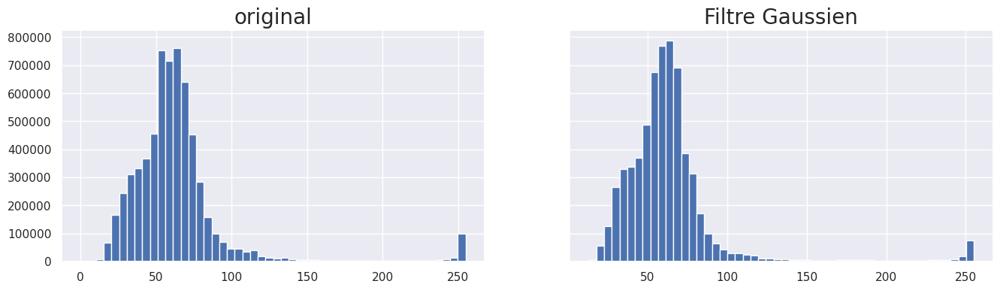

In [134]:
fig, ax = plt.subplots(1,2, figsize = (16,4), sharey=True)

ax[0].hist(np.array(img).ravel() , bins = 50 )
ax[1].hist(np.array(img_gauss).ravel() , bins = 50 )

ax[0].set_title("original", size = 20)
ax[1].set_title("Filtre Gaussien", size = 20)
plt.show()

In [135]:
img == img_med

False

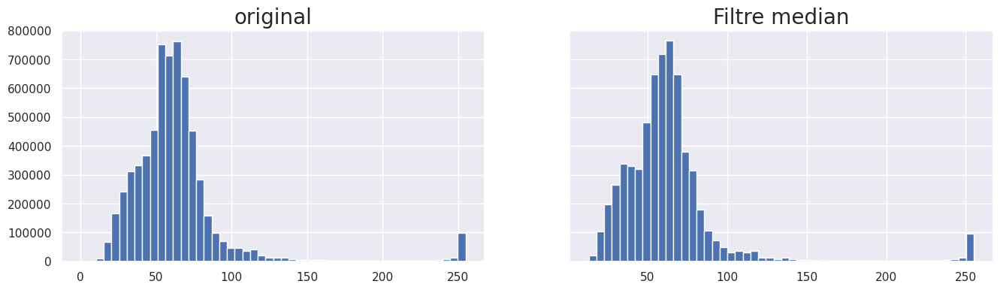

In [136]:
fig, ax = plt.subplots(1,2, figsize = (16,4), sharey=True)

ax[0].hist(np.array(img).ravel() , bins = 50 )
ax[1].hist(np.array(img_med).ravel() , bins = 50 )

ax[0].set_title("original", size = 20)
ax[1].set_title("Filtre median", size = 20)
plt.show()

### Concrètement ces 3 opération sur l'image auront créés 3 nouvelles images différentes de l'image originale mais qui partagent tout de même le même masque car seuls les valeurs de pixels sont modifiés sans modifier la position relative des objets ainsi que leurs orientation


###  D'un autre côté il y a des transformations qui peuvent être réalisées sur l'image qui vont en même temps agir sur le masque : <strong> Ce sont les transformations qui vont modifier la géométrie des objets de l'image. </strong>

### Il s'agit de transformations tels que :

  - ### <strong>    Le recadrage

In [137]:
img_crops = PIL.ImageOps.crop(img,135)

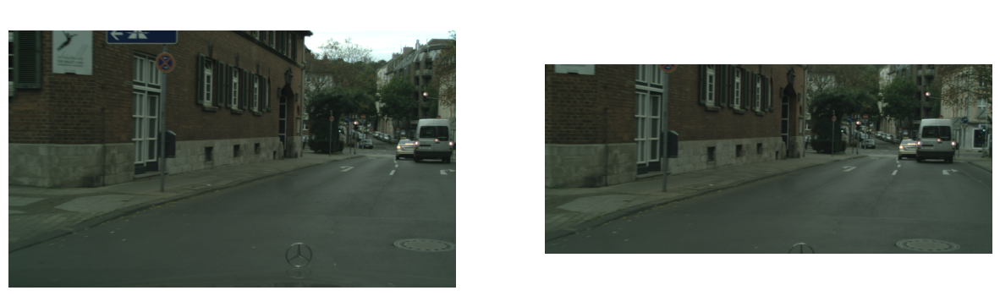

In [138]:
afficher_les_images_supperposees(img,img_crops , 2 , alpha = 1, title="  ")

### Avec pour masque équivalents

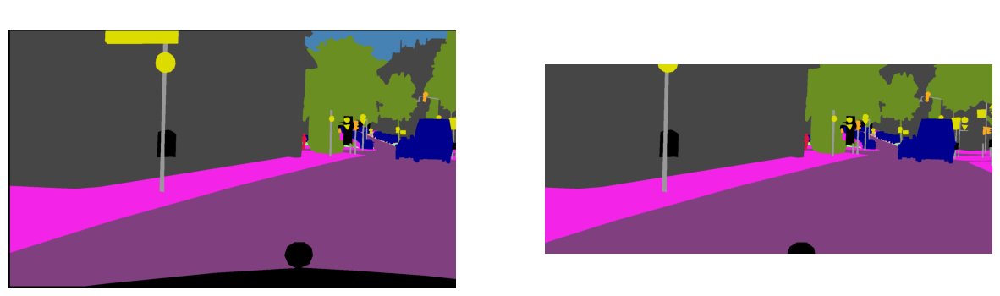

In [139]:
afficher_les_images_supperposees(mask ,PIL.ImageOps.crop(mask,135) , 2 , alpha = 1, title="  ")

  - ### <strong>    une transformation miroir

In [140]:
img_miror = PIL.ImageOps.mirror(img,)

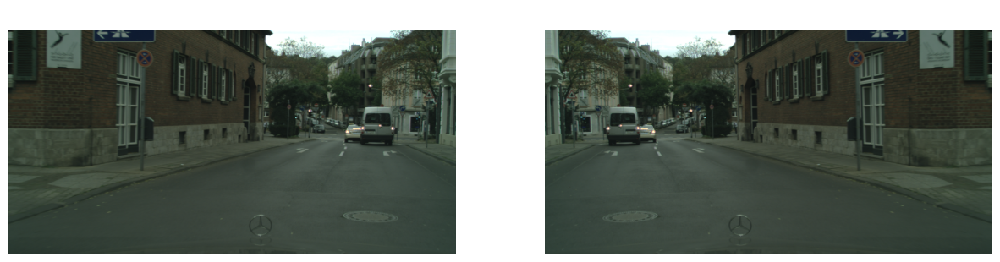

In [141]:
afficher_les_images_supperposees(img,img_miror , 2 , alpha = 1, title="  ")

### Avec pour masque équivalents

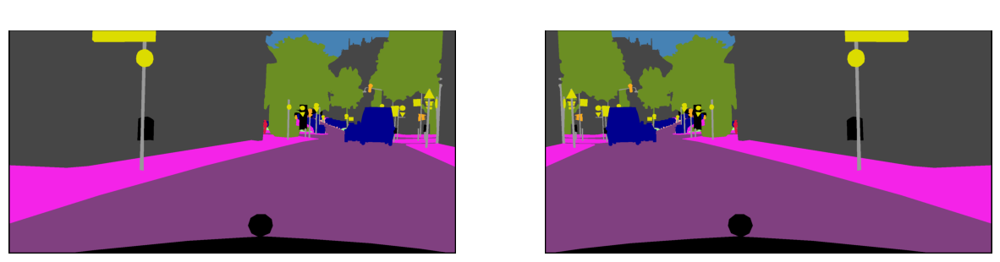

In [142]:
afficher_les_images_supperposees(mask ,PIL.ImageOps.mirror(mask) , 2 , alpha = 1, title="  ")

### La librairie imgaug permet justement de réaliser de façon automatique et aléatoire un vaste nombre de transformation sur les images et les masques associés. 

- <u> Github de la bibliothèque : </u> https://github.com/aleju/imgaug
- <u> Liste des transformations éffectuables : </u>   https://imgaug.readthedocs.io/en/latest/source/overview/arithmetic.html
- <u> Prise en main facile du module : </u> https://imgaug.readthedocs.io/en/latest/source/examples_basics.html
- <u> Exemple d'application sur images et masques : </u>  https://imgaug.readthedocs.io/en/latest/source/examples_segmentation_maps.html     <-----    Ici se trouvent les explications pour le cas présent qui est la segmentation d'images
- <u>  Exemple  : </u>   https://divamgupta.com/image-segmentation/2019/06/06/deep-learning-semantic-segmentation-keras.html#data-augmentation

In [143]:
class AugmentationImagesEtMask (  ) :
    
    # Sometimes(0.5, ...) applies the given augmenter in 50% of all cases,
    # e.g. Sometimes(0.5, GaussianBlur(0.3)) would blur roughly every second
    # image.
    sometimes = lambda aug: iaa.Sometimes(0.6, aug)

    # Define our sequence of augmentation steps that will be applied to every image.
    transformation_par_defaut = iaa.Sequential(
                                                [   # crop some of the images by 0-7% of their height/width
                                                    sometimes(iaa.Crop(percent=(0, 0.07))),
                                                    
                                                    iaa.SaltAndPepper(
                                                        (0.0, 0.05)
                                                    ), 

                                                    # Apply affine transformations to some of the images
                                                    # - scale to 80-120% of image height/width (each axis independently)
                                                    # - translate by -10 to +10 relative to height/width (per axis)
                                                    # - rotate by -45 to +45 degrees
                                                    # - shear by -16 to +16 degrees
                                                    # - order: use nearest neighbour or bilinear interpolation (fast)
                                                    # - mode: use any available mode to fill newly created pixels
                                                    #         see API or scikit-image for which modes are available
                                                    # - cval: if the mode is constant, then use a random brightness
                                                    #         for the newly created pixels (e.g. sometimes black,
                                                    #         sometimes white)
                                                    sometimes(iaa.Affine(
                                                        scale={"x": (0.9, 1.1), "y": (0.9, 1.1)},
                                                        translate_percent={"x": (-0.05, 0.05), "y": (-0.05, 0.05)},
                                                        rotate=(-30, 30),
                                                        shear=(-7, 7),
                                                        order=[0, 1],
                                                        cval=(0, 255),
                                                        mode=imgaug.ALL
                                                    )),
                                                    
                                                    ## add rain
                                                    iaa.Rain(drop_size=(0.0001), speed=(0, 0.0001)),
                                                    # Execute 0 to 5 of the following (less important) augmenters per
                                                    # image. Don't execute all of them, as that would often be way too
                                                    # strong.
                                                    #
                                                    iaa.SomeOf((0, 3),
                                                        [   # Blur each image with varying strength using
                                                            # gaussian blur (sigma between 2.0 and 5.0),
                                                            # average/uniform blur (kernel size between 2x2 and 7x7)
                                                            # median blur (kernel size between 3x3 and 11x11).
                                                            iaa.RemoveSaturation((0.0, 1.0)),
                                                            
                                                            # Sharpen each image, overlay the result with the original
                                                            # image using an alpha between 0 (no sharpening) and 1
                                                            # (full sharpening effect).
                                                            iaa.Sharpen(alpha=(0, 1.0), lightness=(1., 1.8)),

                                                            # Add gaussian noise to some images.
                                                            # In 50% of these cases, the noise is randomly sampled per
                                                            # channel and pixel.
                                                            # In the other 50% of all cases it is sampled once per
                                                            # pixel (i.e. brightness change).
                                                            iaa.AdditiveGaussianNoise(
                                                                loc=0, scale=(0.0, 0.05*25), per_channel=0.5
                                                            ),

                                                            # Change brightness of images (70-180% of original value).
                                                            iaa.Multiply((.7, 1.8), per_channel=0.5),

                                                            # Improve or worsen the contrast of images.
                                                            iaa.LinearContrast((1.2, 2.0), per_channel=0.5),
                                                        ],
                                                        # do all of the above augmentations in random order
                                                        random_order=True
                                                    )
                                                ],
                                                # do all of the above augmentations in random order
                                                random_order=True
                                            )

    def __init__ ( self, image, mask, batch_size=3, nb_batch=4, transformations = None) :
        if not isinstance( image,  list) :
            self.image = [image]
            self.mask = [mask]
        else : 
            self.image = image
            self.mask = mask
                    
        #######################################################################
        ########   Utile pour le mode augmentation multiprocesseur    #########
        self.batch_size = batch_size
        self.nb_batch = nb_batch
        
        #############################################################################################################
        ########   Objet definissant l'ensemble des transformations à appliquer sur l'image et le masque    #########        
        if transformations :
            self.transformations = transformations
        else :
            self.transformations = AugmentationImagesEtMask.transformation_par_defaut
        
        ##############################################################
        #######   Sortie des résultats des transformations   #########
        # return self.transform()  # Opération strictement interdite dans la fonction __init__()
        
    def transform(self) :
        #################################
        imgaug.seed( randint(1,20) )
        
        img_finale, mask_final  =[], []
        for image, mask in zip( self.image, self.mask ) :
            ################################################################################################
            ######      Objet masque représentant une association entre une image et son masque      #######
            segmap = SegmentationMapsOnImage( mask, shape = image.shape )

            ##############################################################################################################################
            ######    Initialisation d'un batch de masques avec des copies de masques en autant de fois quela taille du batch      #######          
            segmaps = [segmap for _ in range( self.batch_size ) ]        

            ############################################################################################################################
            ######    Initialisation d'un batch d'images avec des copies de l'image en autant de fois quela taille du batch      #######        
            images = [ image for _ in range( self.batch_size ) ]

            #######################################################################################################################
            ######    Création de notre liste de batchs à partir des deux batch images et masques précédement definies      #######         
            batches = [ UnnormalizedBatch(images=images, segmentation_maps=segmaps) for _ in range(self.nb_batch) ]

            ################################################
            ######    transformation des images      ####### 
            batches_aug = list( self.transformations.augment_batches( batches, background = True ) )

            img_finale.extend([ batches_aug[j].images_aug[i] for i in range(self.batch_size) for j in range(self.nb_batch) ])

            #################################################
            ######    transformation des masques      ####### 
            mask_final.extend([  batches_aug[j].segmentation_maps_aug[i].get_arr() 
                              for i in range(self.batch_size) 
                              for j in range(self.nb_batch)
                         ])

            ##############################################################################################################################
            ######    rajout des originaux des images et masques en bout de liste des images et masques augmentés/transformés      ####### 

            img_finale.append( image )
            mask_final.append( mask )

        return img_finale, mask_final    


# <strong> V.1 - test de fonctionnement de l'augmenteur de donées 

### Tout d'abord on crée une instance `augmenter` de notre classe d'augmentation de données

In [144]:
img_0 =  np.array( image_utils.load_img(chemin_image+files_name[0]),dtype="uint8")
mask_0 =  np.array( image_utils.load_img(chemin_masque_labelIds+files_name[0], grayscale=True),dtype="uint8") 

  - ### <strong>    On transforme les données

In [145]:
augmenter = AugmentationImagesEtMask( img_0 , mask_0    )
x, y = augmenter.transform()

In [146]:
print( len(x), len(y))

13 13


In [147]:
all(x[-1] == img_0 )

True

In [148]:
all(y[-1] == mask_0 )

True

In [149]:
x[0].shape

(1024, 2048, 3)

In [150]:
y[0].shape

(1024, 2048)

  - ### <strong>    On peut afficher les images ainsi que leurs masques transformés

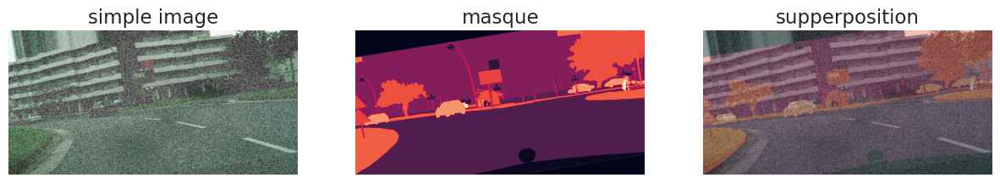

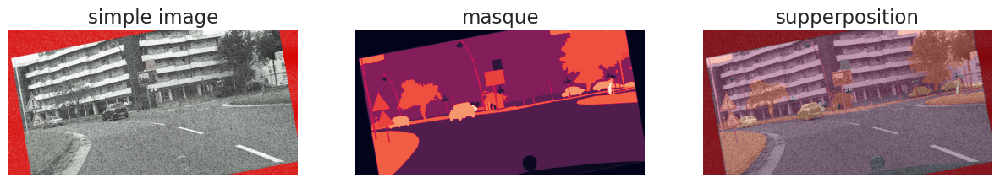

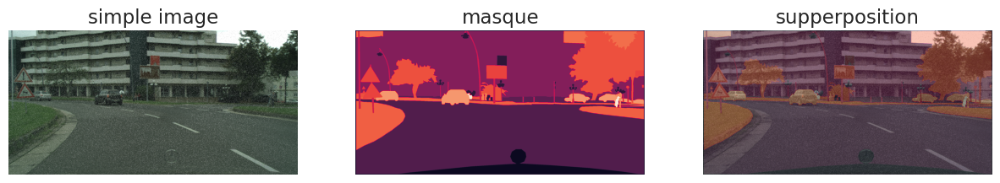

In [152]:
for i in range(len(x)%2+ 2): 
    afficher_les_images_supperposees( x[i] , y[i] , style= 3, alpha= 0.4)